## Cristian CHÁVEZ

# Exercice 1: Learning a WGAN for synthetic 2-dimensional datasets

<br/><br/><br/><br/>

This practical session contains
- "QUESTION" fields in the text, that you should answer
- blocks of code that you should complete at every region marked with ### ... ###

We advise you to open the notebook on Google Colab.

### Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

if torch.cuda.is_available():
    device = torch.device('cuda')
    dtype = torch.cuda.FloatTensor
else:
    device = torch.device('cpu')
    dtype = torch.FloatTensor

# If you don't want to bother with the device, stay on cpu:
# device = torch.device('cpu')

print(device)

cuda


### Target Measure

In the following cell, we define the discrete target measure $\nu$ that will serve as dataset for this practical session.

The variable `xgrid` contains a grid of points that will be useful below to display the discriminators along training.

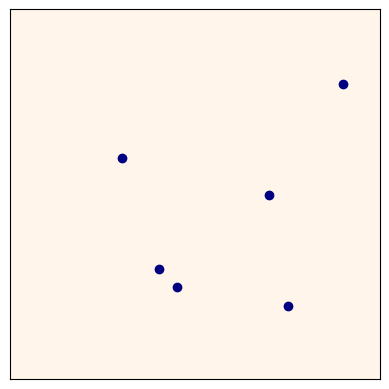

In [ ]:
d = 2   # dimension of the data points

# First dataset with 6 points
n = 6
y = torch.zeros((n,d), device=device)
y[0, 0] = 0.9
y[0, 1] = 0.2
y[1, 0] = 0.75
y[1, 1] = 0.8
y[2, 0] = 0.3
y[2, 1] = 0.4
y[3, 0] = 0.4
y[3, 1] = 0.7
y[4, 0] = 0.45
y[4, 1] = 0.75
y[5, 0] = 0.7
y[5, 1] = 0.5

# # Second dataset with 100 points
# n = 100
# t = torch.pi*torch.linspace(-.2,1.2,n)
# y = .05*torch.randn((n,d))
# y[:,0] += torch.cos(t)
# y[:,1] += torch.sin(2*t)
# y = .5 + .3*y
# y = y.to(device)

# Define masses (empirical measure on the data points)
nu = torch.ones(n, device=device)/n

# generate grid for plotting purpose
nr,nc = 256,256
extent = ((-0.5/nc, 1-0.5/nc, 1-0.5/nr, -0.5/nr))
xs = torch.linspace(0, 1, steps=nr)
ys = torch.linspace(0, 1, steps=nc)
xm, ym = torch.meshgrid(xs, ys, indexing='ij')
xm = xm.T
ym = ym.T
xgrid = torch.cat((xm.reshape(nr*nc,1),ym.reshape(nr*nc,1)),1).to(device)

# Plot data points
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

## Define Generator architecture

QUESTION: Examine the layers and parameters of the following generative network.

Write a short description of the architecture of this network.

ANSWER:

This generator network is designed to generate synthetic data points:

1. **Input and Output Dimensions**:
   - `n_in`: Dimensionality of the input noise vector.
   - `n_out`: Dimensionality of the output data points.

2. **Hidden Layers**:
   - `n_hid`: Number of hidden units in each hidden layer.
   - `nlayers`: Number of hidden layers in the network.

3. **Activation Function**:
   - ELU (Exponential Linear Unit): Used in each hidden layer.

4. **Modules**:
   - `hidden`: List of `nlayers` hidden layers, each defined as a sequential module consisting of:
     - Linear transformation: `nn.Linear(n_in_t, n_hid)`, where `n_in_t` is the input dimension of the current layer, which is equal to `n_in` for the first layer and `n_hid` for subsequent layers.
     - Activation function: ELU with a parameter of 1.
   - `out`: Final output layer, defined as a sequential module consisting of:
     - Linear transformation: `nn.Linear(n_hid, n_out)`.
     - Sigmoid activation function: Applied to constrain the output within the range [0, 1].

5. **Initialization**:
   - Weight initialization: The weights of the linear layers are initialized using Xavier uniform initialization with a gain factor of 1.0.
   - Bias initialization: Initialized to zero.

Overall, this generator network consists of `nlayers` hidden layers, each with `n_hid` units, and produces synthetic data points of dimensionality `n_out`. ELU activation functions are used in the hidden layers to introduce non-linearity, and the final output is constrained within the range [0, 1] using a sigmoid activation function. The weight initialization scheme helps in stabilizing the training process by ensuring that the weights are initialized in a way that doesn't lead to exploding or vanishing gradients.


In [ ]:
class Generator(torch.nn.Module):

    def __init__(self, n_in, n_out, n_hid=10, nlayers=3, device=torch.device("cpu")):
        super(Generator, self).__init__()

        self.n_in = n_in
        self.n_out = n_out
        self.n_hid = n_hid
        self.nlayers = nlayers
        self.hidden = nn.ModuleList()

        for n in range(nlayers):
            n_in_t = n_in if n==0 else n_hid
            self.hidden.append(nn.Sequential(
            nn.Linear(n_in_t, n_hid),
            nn.ELU(1)
        ).to(device))

        self.out = nn.Sequential(
            nn.Linear(n_hid, n_out),
            nn.Sigmoid()
        ).to(device)

        self.apply(self._init_weights)


    def forward(self, x):
        for n in range(self.nlayers):
            x = self.hidden[n](x)
        x = self.out(x)
        return x


    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight, 1.0)
            if module.bias is not None:
                module.bias.data.zero_()


QUESTION: Plot one initial configuration of the generator (draw a batch of generated points)

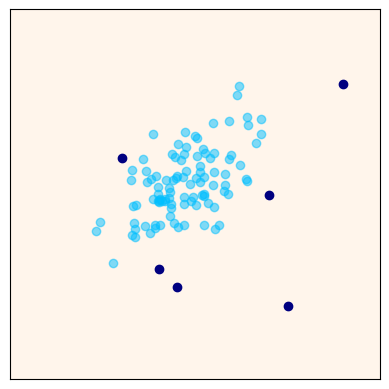

In [ ]:
torch.manual_seed(0)  # initialize random seed for reproducibility

n_in = 10    # dimension of the input noise
b = 100      # batch size

# Initialize generator
G = Generator(n_in=n_in, n_out=d, n_hid=100, nlayers=3, device=device)

# Draw a batch x of generated points
#    Input noise z : standard normal with shape (b, n_in)

### ... ###
z = torch.randn(b, n_in, device=device)
x = G(z)

# Plot
xd = x.detach()
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

## Define Discriminator Architecture

In [ ]:
class Discriminator(nn.Module):
  def __init__(self, n_in, n_hid=10):
    super(Discriminator, self).__init__()

    self.n_hid = n_hid
    self.n_in = n_in

    self.fc1 = nn.Linear(n_in, n_hid)
    self.fc2 = nn.Linear(n_hid, n_hid)
    self.fc3 = nn.Linear(n_hid, 1)

  def forward(self, x):
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc1(x))
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc2(y))
    y = self.fc3(y)
    return y

## Discriminator training with Weight clipping

QUESTION: For a fixed generator, train the discriminator with WGAN loss and weight clipping.

Try changing the clip_value. What do you observe?

**Answer:**

#### 1. Small Clip Values (e.g., [-0.01, 0.01])
Training Stability: Small clip values lead to more stable training initially, as they prevent the weights of the discriminator from growing too large.

Gradient Restriction: However, if the clip value is too small, it severely restricts the range of possible weight values. This restriction can lead to the discriminator having insufficient capacity to distinguish between real and fake data effectively.

Underfitting: Lipschitz is too constraint, so that the model is not able to capture complex patterns. The discriminator may underfit, failing to provide meaningful gradients to the generator. This underfitting can result in poor feedback and slow or suboptimal improvements in the generator’s output quality.
####  2. Moderate Clip Values (e.g., [-0.1, 0.1])
Balanced Training: Moderate clip values offer a balance between restricting weight values and allowing enough flexibility for the discriminator to learn effectively. This balance tends to provide a good trade-off between stability and capacity.

Effective Learning: The discriminator has enough capacity to learn meaningful differences between real and fake data, leading to better feedback for the generator and improved quality of generated data.

Convergence: Training is more effective, and the GAN may converge to better solutions compared to very small or very large clip values.
#### 3. Large Clip Values (e.g., [-1, 1] or higher)
Large clip values allow weights to grow significantly, which can lead to instability in training. The discriminator might have weights with very large magnitudes.

Overfitting: The discriminator may overfit to the training data, becoming too powerful and easily distinguishing real from fake data. This overfitting can lead to vanishing gradients for the generator, stalling its learning process.

Instability: Training can become unstable, with the discriminator oscillating or diverging, resulting in poor and unstable feedback for the generator.
Summary of Observations

[0/1000], 0.010855


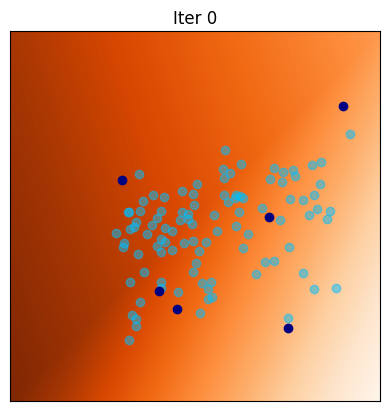

[100/1000], -0.000000


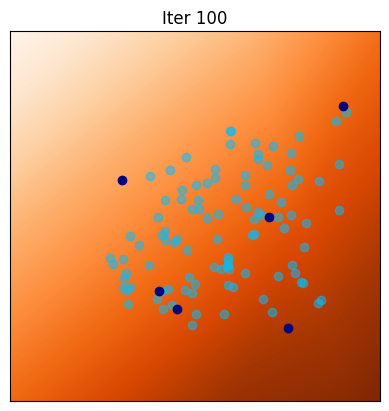

[200/1000], -0.000001


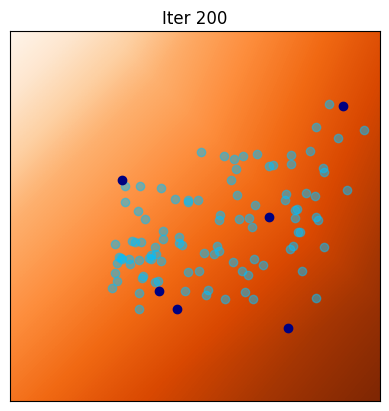

[300/1000], -0.000001


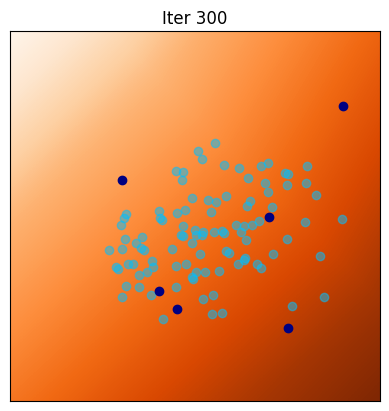

[400/1000], -0.000002


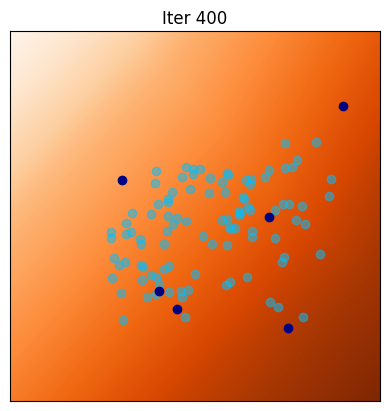

[500/1000], -0.000001


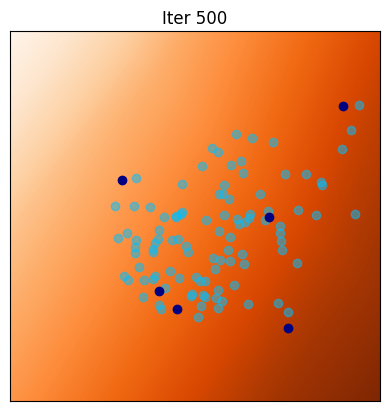

[600/1000], -0.000002


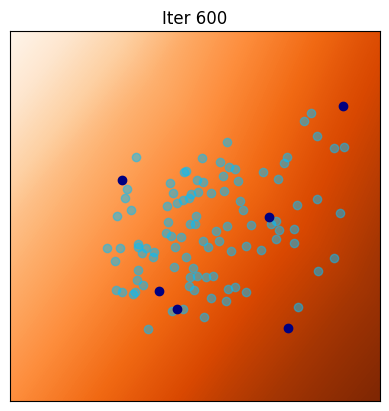

[700/1000], -0.000001


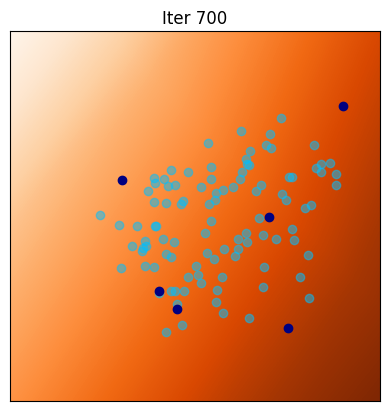

[800/1000], -0.000002


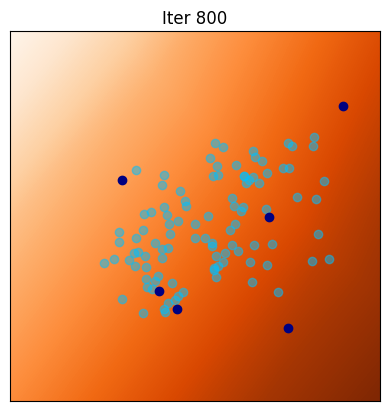

[900/1000], -0.000002


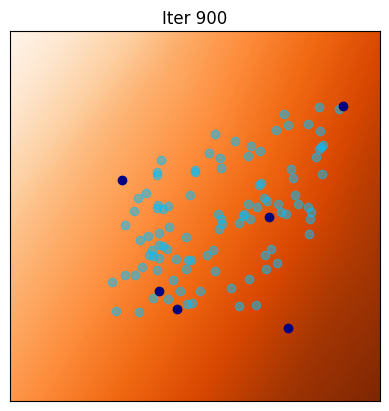

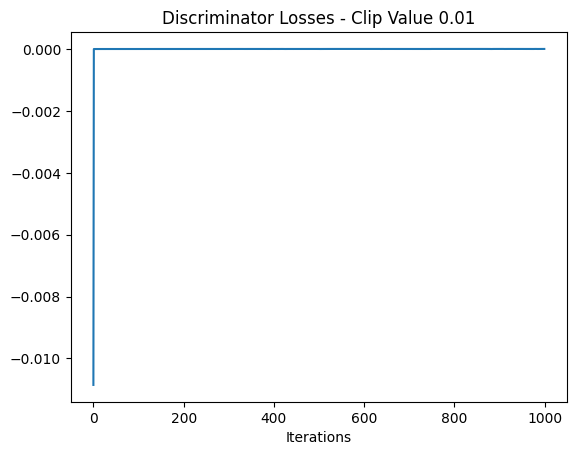

In [ ]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# fix one generator
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

clip_value = .01

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0, niterD):
    # UPDATE OF D
    optimD.zero_grad()

    # Generate fake data
    z = torch.randn(b, n_in, device=device)
    x_fake = G(z)

    # Compute WGAN loss for fake data
    D_fake = D(x_fake)
    D_fake_mean = torch.mean(D_fake)

    # Compute WGAN loss for real data
    x_real = y
    D_real = D(x_real)
    D_real_mean = torch.mean(D_real)

    # Compute total discriminator loss
    Dloss = D_fake_mean - D_real_mean

    # Backpropagation and optimization
    Dloss.backward()
    optimD.step()

    # Weight Clipping
    for param in D.parameters():
        param.data.clamp_(-clip_value, clip_value)

    # SAVE LOSS
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if iter % iter_display == 0:
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter ' + str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

plt.plot(Dlosses)
plt.title(f'Discriminator Losses - Clip Value {clip_value}')
plt.xlabel('Iterations')
plt.show()


[0/1000], 0.010855


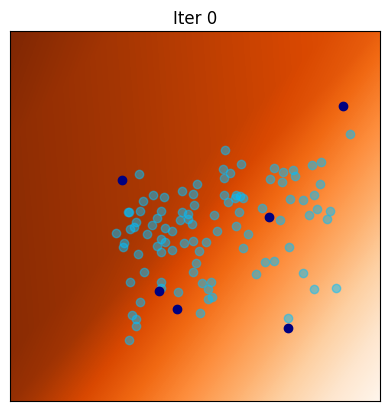

[100/1000], -0.001058


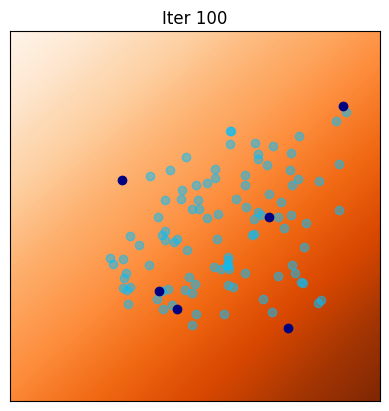

[200/1000], -0.002462


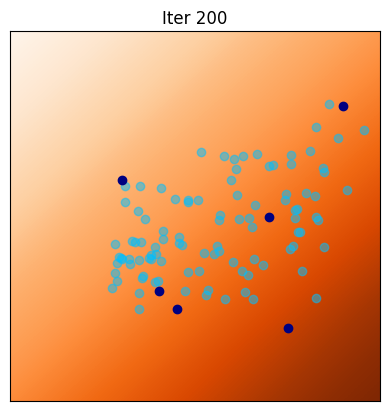

[300/1000], -0.003468


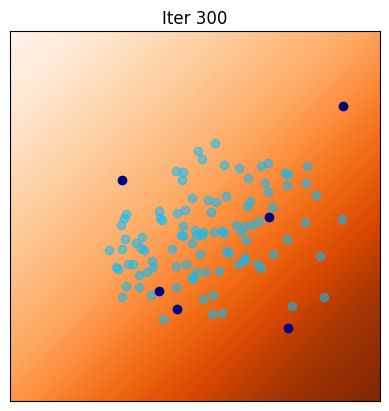

[400/1000], -0.004206


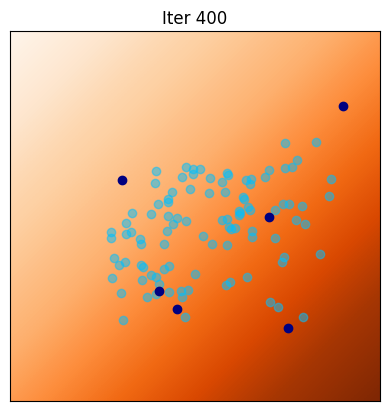

[500/1000], -0.002640


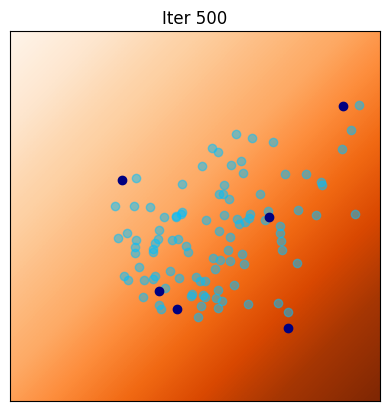

[600/1000], -0.004126


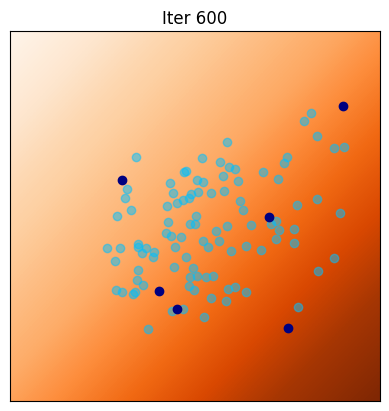

[700/1000], -0.003504


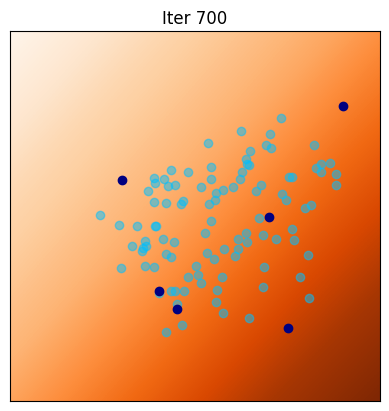

[800/1000], -0.004521


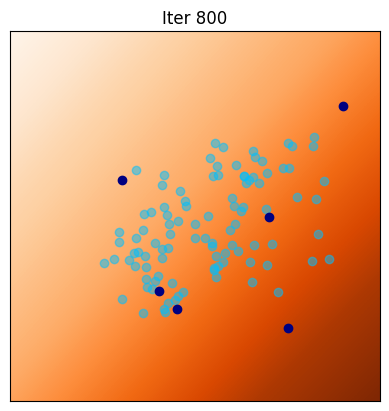

[900/1000], -0.003996


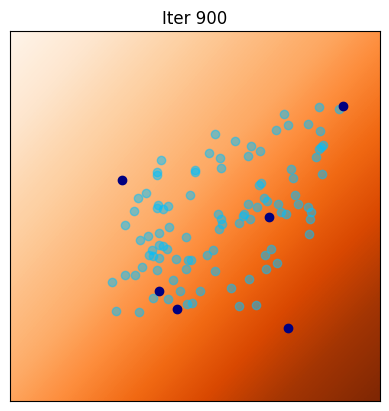

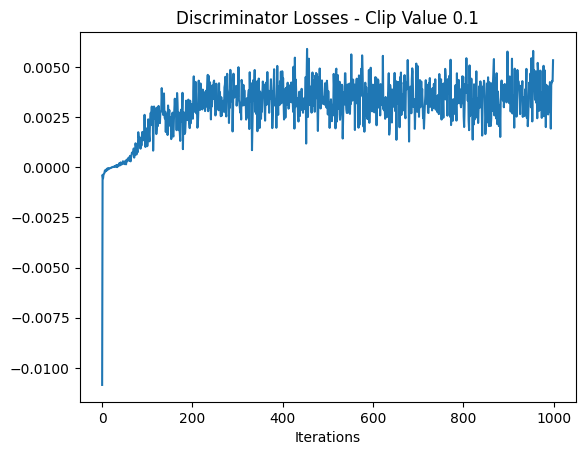

In [ ]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# fix one generator
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

clip_value = .1

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0, niterD):
    # UPDATE OF D
    optimD.zero_grad()

    # Generate fake data
    z = torch.randn(b, n_in, device=device)
    x_fake = G(z)

    # Compute WGAN loss for fake data
    D_fake = D(x_fake)
    D_fake_mean = torch.mean(D_fake)

    # Compute WGAN loss for real data
    x_real = y
    D_real = D(x_real)
    D_real_mean = torch.mean(D_real)

    # Compute total discriminator loss
    Dloss = D_fake_mean - D_real_mean

    # Backpropagation and optimization
    Dloss.backward()
    optimD.step()

    # Weight Clipping
    for param in D.parameters():
        param.data.clamp_(-clip_value, clip_value)

    # SAVE LOSS
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if iter % iter_display == 0:
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter ' + str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

plt.plot(Dlosses)
plt.title(f'Discriminator Losses - Clip Value {clip_value}')
plt.xlabel('Iterations')
plt.show()

[0/1000], 0.010855


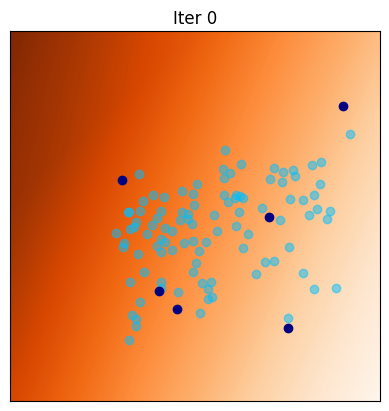

[100/1000], -0.056105


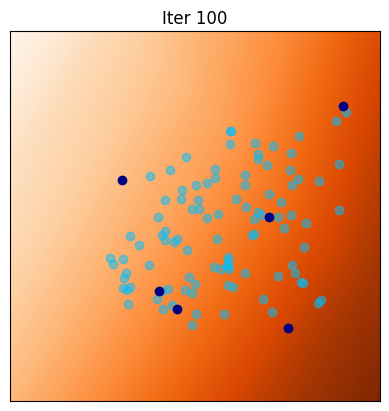

[200/1000], -0.584476


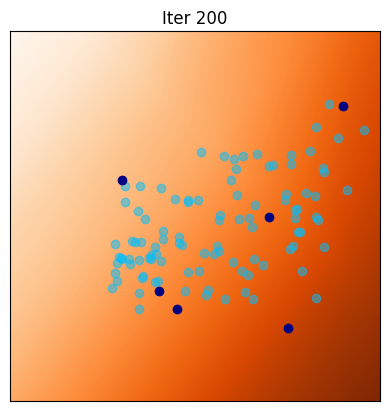

[300/1000], -1.949143


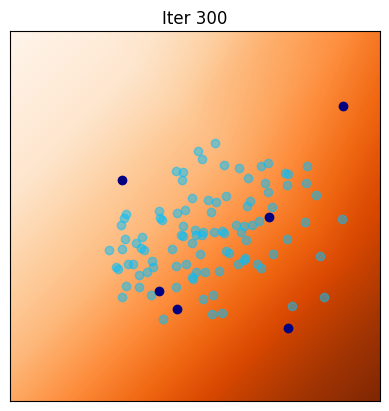

[400/1000], -2.916182


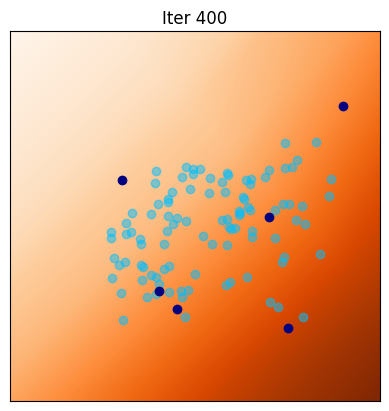

[500/1000], -2.304730


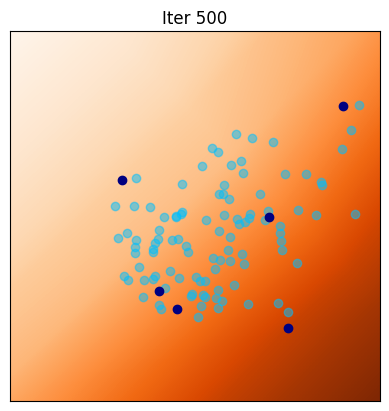

[600/1000], -3.453362


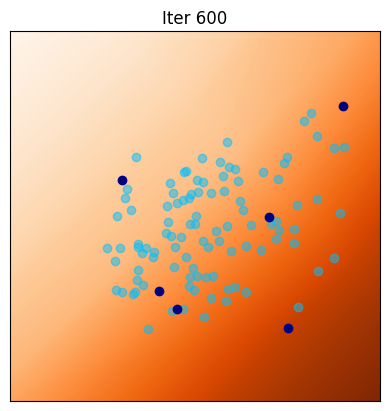

[700/1000], -3.257010


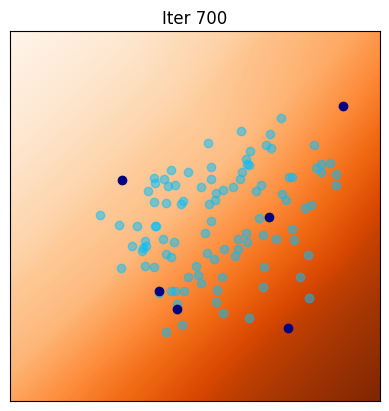

[800/1000], -4.080173


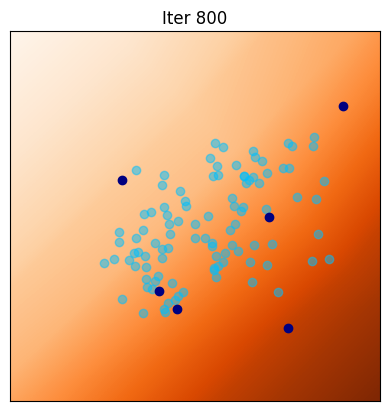

[900/1000], -3.777923


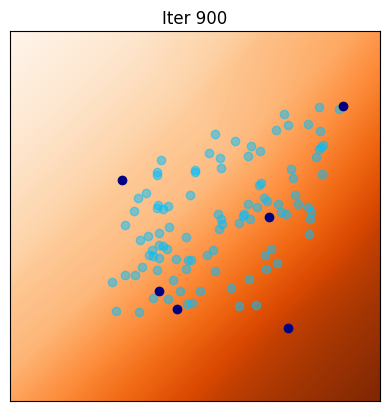

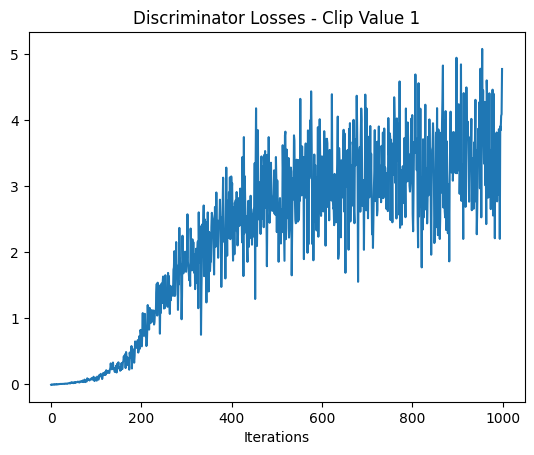

In [ ]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# fix one generator
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

clip_value = 1

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0, niterD):
    # UPDATE OF D
    optimD.zero_grad()

    # Generate fake data
    z = torch.randn(b, n_in, device=device)
    x_fake = G(z)

    # Compute WGAN loss for fake data
    D_fake = D(x_fake)
    D_fake_mean = torch.mean(D_fake)

    # Compute WGAN loss for real data
    x_real = y
    D_real = D(x_real)
    D_real_mean = torch.mean(D_real)

    # Compute total discriminator loss
    Dloss = D_fake_mean - D_real_mean

    # Backpropagation and optimization
    Dloss.backward()
    optimD.step()

    # Weight Clipping
    for param in D.parameters():
        param.data.clamp_(-clip_value, clip_value)

    # SAVE LOSS
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if iter % iter_display == 0:
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter ' + str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

plt.plot(Dlosses)
plt.title(f'Discriminator Losses - Clip Value {clip_value}')
plt.xlabel('Iterations')
plt.show()

## Estimate the Lipschitz constant of the discriminator

The following function computes a lower bound of the Lipschitz constant of $D$ on points that are interpolated between $x$ and $y$.

NB: If $x$ and $y$ do not have the same number of points, we discard the last points.
In comment, we give an alternative code that allows to compute all segments $[x_i, y_j]$ (but it is, of course, slower that just computing segments $[x_i, y_i]$).

In [ ]:
def lipconstant(D,x,y):
    b = x.shape[0]
    n = y.shape[0]
    # shrink vectors if they are too large
    if n>b:
        y = y[0:b,:]
        n = b
    else:
        x = x[0:n,:]
        b = n
    # compute interpolated points
    alpha = torch.rand((b,1),device=device)
    interp = alpha * y + (1 - alpha) * x
    interp.requires_grad_()

    # Calculate probability of interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradout = torch.ones(Di.size()).to(device)
    gradients = torch.autograd.grad(outputs=Di, inputs=interp, grad_outputs=gradout,
       create_graph=True, retain_graph=True)[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1))

    # Return gradient penalty
    return torch.mean(gradients_norm)

#     # Calculate interpolation
#     b = x.shape[0]
#     n = y.shape[0]
#     alpha = torch.rand((b,n,1),device=device)
#     interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
#     interp.requires_grad_()


QUESTION: Use this function to examine the Lipschitz constant of the final discriminator obtained above with weight clipping.


In [ ]:
### ... ###
# Compute Lipschitz constant
Lipschitz_constant = lipconstant(D, x_real, x_fake)
print("Estimated Lipschitz constant for  discriminator:", Lipschitz_constant.item())

Estimated Lipschitz constant for  discriminator: 0.06486938893795013


## Gradient Penalty

QUESTION: Implement a function computing the gradient penalty of a discriminator $D$ on points $X$ that are randomly interpolated between $x$ and $y$:
$$ GP(D) = \mathbb{E}\left[ \Big(\|\nabla D(X)\| - 1 \Big)^2 \right] .$$
In pratice you will use
$$\|\nabla D(X)\| \approx \sqrt{\|\nabla D (X)\|_2^2 + 10^{-12} } $$
to avoid numerical instability.

In [ ]:
def gradient_penalty(D,x,y):
    b = x.shape[0]
    n = y.shape[0]
    # shrink vectors if they are too large
    if n>b:
        y = y[0:b,:]
        n = b
    else:
        x = x[0:n,:]
        b = n
    # compute interpolated points
    alpha = torch.rand((b,1),device=device)
    interp = (alpha * y + (1 - alpha) * x)
    interp.requires_grad_()

#     # Calculate interpolation
#     b = x.shape[0]
#     n = y.shape[0]
#     alpha = torch.rand((b,n,1),device=device)
#     interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
#     interp.requires_grad_()

    # Calculate probability of interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradout = torch.ones(Di.size()).to(device)
    gradients = torch.autograd.grad(outputs=Di, inputs=interp, grad_outputs=gradout,
       create_graph=True, retain_graph=True)[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)

    # Return gradient penalty
    return ((gradients_norm - 1) ** 2).mean()
#     return ((gradients_norm - 1) ** 2*(gradients_norm>1)).mean()

print(gradient_penalty(D,x,y))

tensor(0.8657, device='cuda:0', grad_fn=<MeanBackward0>)


## Discriminator training with Gradient Penalty

QUESTION: Complete the following code at the blocks ###...###.

Adjust the weight of the gradient penalty (parameter `gpw`) to get a Lipschitz constant $\approx 1$.

[0/1000], Dloss=5.6300, Lip(D)=0.2644


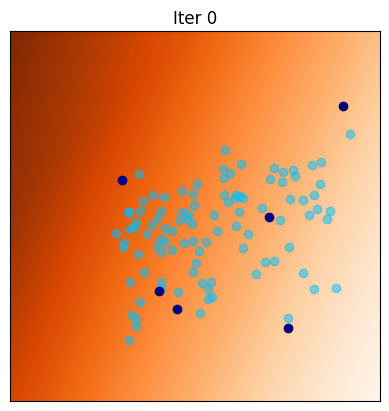

[100/1000], Dloss=0.0306, Lip(D)=0.9894


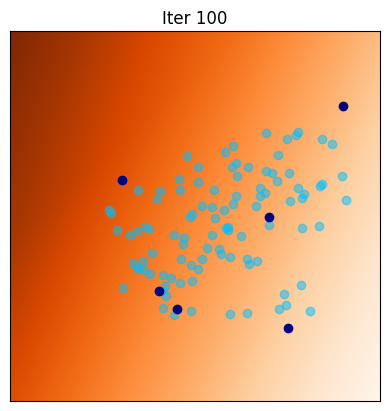

[200/1000], Dloss=0.0349, Lip(D)=1.0024


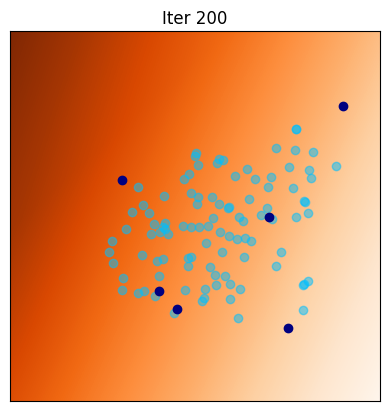

[300/1000], Dloss=0.0206, Lip(D)=1.0001


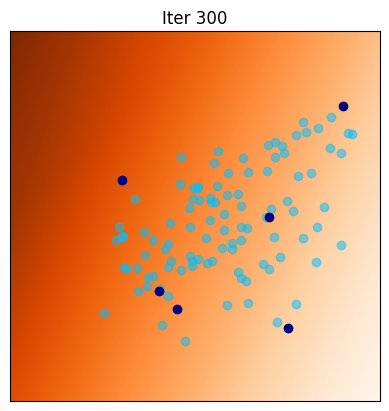

[400/1000], Dloss=0.0582, Lip(D)=0.9946


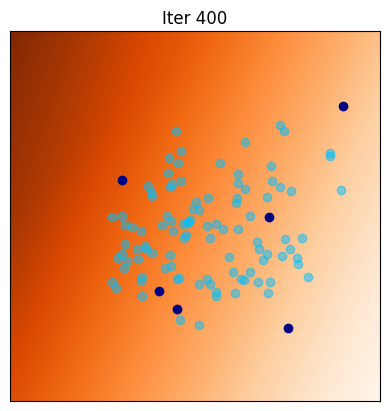

[500/1000], Dloss=0.0366, Lip(D)=0.9920


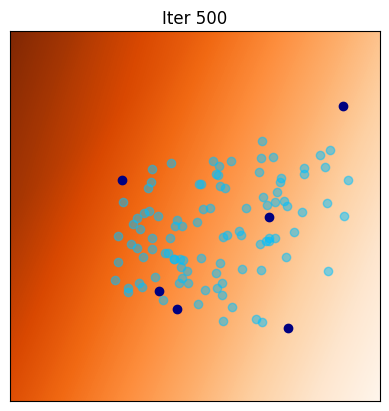

[600/1000], Dloss=0.0388, Lip(D)=0.9961


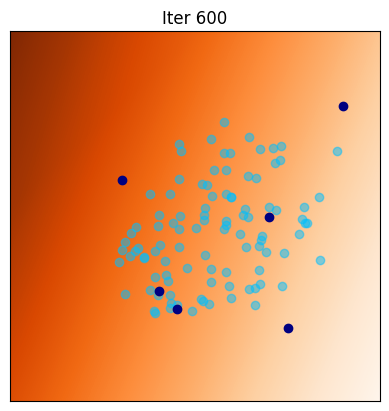

[700/1000], Dloss=0.0359, Lip(D)=1.0002


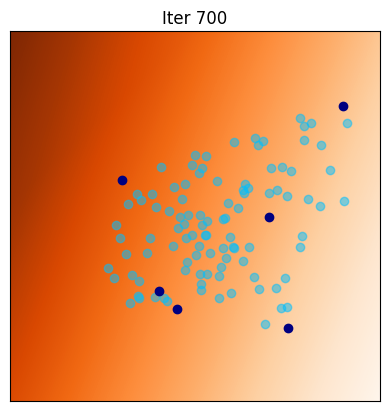

[800/1000], Dloss=0.0472, Lip(D)=0.9989


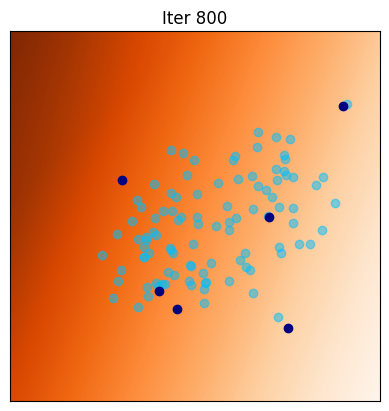

[900/1000], Dloss=0.0598, Lip(D)=0.9979


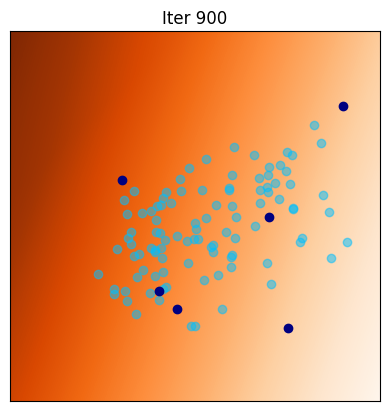

Final estimated Lipschitz constant = 0.9979364275932312


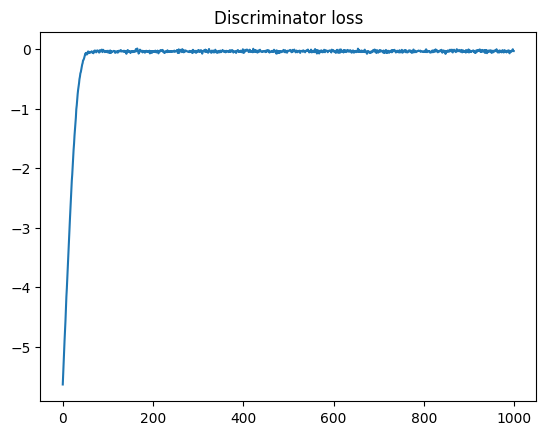

In [ ]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
D = Discriminator(n_in=d, n_hid=10).to(device)

# parameters for training
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000
gpw = 10       # parameter for gradient penalty

optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0, niterD):
    # UPDATE OF D
    optimD.zero_grad()

    # Generate fake data
    z = torch.randn(b, n_in, device=device)
    x_fake = G(z)

    # Compute WGAN loss for fake data
    D_fake = D(x_fake)
    D_fake_mean = torch.mean(D_fake)

    # Compute WGAN loss for real data
    x_real = y
    D_real = D(x_real)
    D_real_mean = torch.mean(D_real)

    # Compute total discriminator loss
    Dloss = D_fake_mean - D_real_mean

    # Gradient Penalty
    gp = gradient_penalty(D, x_real, x_fake)
    Dloss += gp * gpw

    # Backpropagation and optimization
    Dloss.backward()
    optimD.step()

    # SAVE LOSS
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if iter % iter_display == 0:
        lipschitz_estimate = lipconstant(D, x_real, x_fake).item()
        print('[%d/%d], Dloss=%.4f, Lip(D)=%.4f' % (iter, niterD, Dlosst, lipschitz_estimate))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter ' + str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

print('Final estimated Lipschitz constant =', lipschitz_estimate)

plt.figure(dpi=100)
plt.plot(Dlosses)
plt.title('Discriminator loss')
plt.show()


## WGAN-GP training

QUESTION: Complete the following code in order to train simultaneously the generator and discriminator.

You will alternate `niterD` iterations on the discriminator and `niterG` iterations of the discriminator.

[1/100] 	Loss_D: -0.1725	Loss_G: 0.0575	Lip(D)=1.6682
[2/100] 	Loss_D: -0.1000	Loss_G: 0.3115	Lip(D)=1.3102
[3/100] 	Loss_D: -0.1178	Loss_G: 0.2376	Lip(D)=1.4743
[4/100] 	Loss_D: -0.1574	Loss_G: 0.0443	Lip(D)=1.2894
[5/100] 	Loss_D: -0.1546	Loss_G: -0.4224	Lip(D)=1.7045


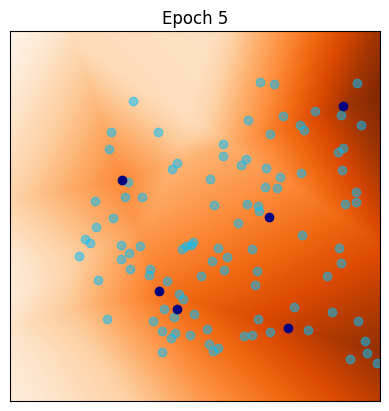

[6/100] 	Loss_D: -0.0974	Loss_G: 0.2069	Lip(D)=1.3582
[7/100] 	Loss_D: -0.1490	Loss_G: 0.3742	Lip(D)=1.3408
[8/100] 	Loss_D: -0.1141	Loss_G: 0.3890	Lip(D)=1.3700
[9/100] 	Loss_D: -0.0706	Loss_G: 0.5724	Lip(D)=1.4717
[10/100] 	Loss_D: -0.0870	Loss_G: 0.7531	Lip(D)=1.3652


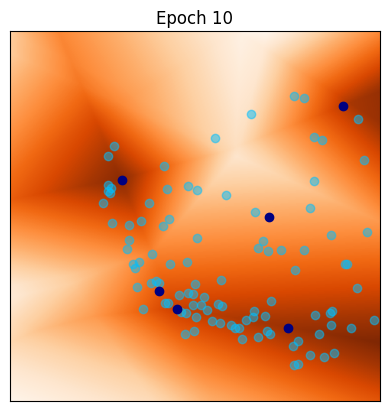

[11/100] 	Loss_D: -0.1010	Loss_G: 0.5124	Lip(D)=1.2332
[12/100] 	Loss_D: -0.0845	Loss_G: 0.3038	Lip(D)=1.2179
[13/100] 	Loss_D: -0.0860	Loss_G: 0.5008	Lip(D)=1.1812
[14/100] 	Loss_D: -0.0904	Loss_G: 0.0705	Lip(D)=1.4867
[15/100] 	Loss_D: -0.0875	Loss_G: -0.8390	Lip(D)=1.3696


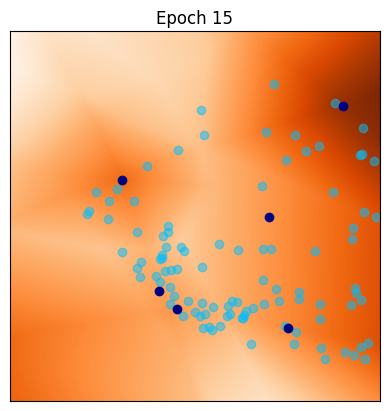

[16/100] 	Loss_D: -0.1114	Loss_G: -0.9698	Lip(D)=1.4285
[17/100] 	Loss_D: -0.0668	Loss_G: -1.2040	Lip(D)=1.2605
[18/100] 	Loss_D: -0.0667	Loss_G: -0.8235	Lip(D)=1.1959
[19/100] 	Loss_D: -0.0784	Loss_G: -0.2065	Lip(D)=1.3163
[20/100] 	Loss_D: -0.0926	Loss_G: -0.0815	Lip(D)=1.3828


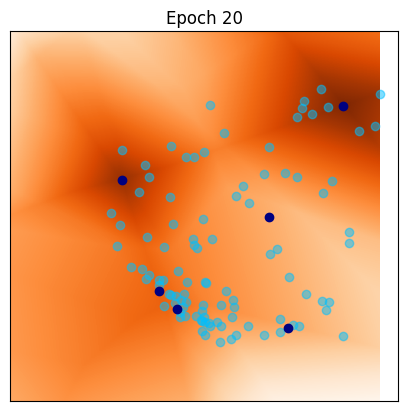

[21/100] 	Loss_D: -0.0555	Loss_G: -1.2662	Lip(D)=1.4421
[22/100] 	Loss_D: -0.0920	Loss_G: -2.0060	Lip(D)=1.4447
[23/100] 	Loss_D: -0.0844	Loss_G: -3.3979	Lip(D)=1.5022
[24/100] 	Loss_D: -0.0999	Loss_G: -3.7345	Lip(D)=1.2583
[25/100] 	Loss_D: -0.1146	Loss_G: -4.2027	Lip(D)=1.5412


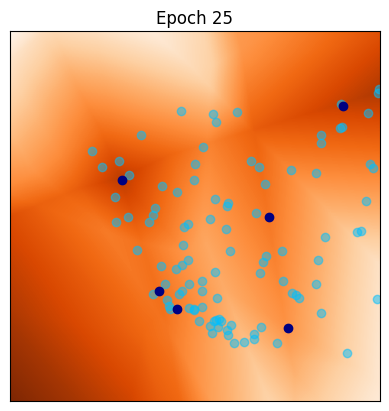

[26/100] 	Loss_D: 0.0267	Loss_G: -4.8042	Lip(D)=1.4146
[27/100] 	Loss_D: -0.1057	Loss_G: -5.2262	Lip(D)=1.3030
[28/100] 	Loss_D: -0.1180	Loss_G: -5.5212	Lip(D)=1.2991
[29/100] 	Loss_D: -0.0792	Loss_G: -5.9797	Lip(D)=1.4480
[30/100] 	Loss_D: -0.1343	Loss_G: -5.8841	Lip(D)=1.4424


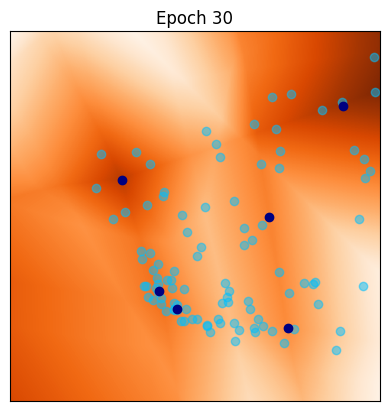

[31/100] 	Loss_D: -0.1025	Loss_G: -6.0414	Lip(D)=1.3324
[32/100] 	Loss_D: -0.0914	Loss_G: -6.8907	Lip(D)=1.4752
[33/100] 	Loss_D: -0.0786	Loss_G: -7.4555	Lip(D)=1.5788
[34/100] 	Loss_D: -0.1159	Loss_G: -7.5616	Lip(D)=1.3893
[35/100] 	Loss_D: -0.1040	Loss_G: -6.5160	Lip(D)=1.0508


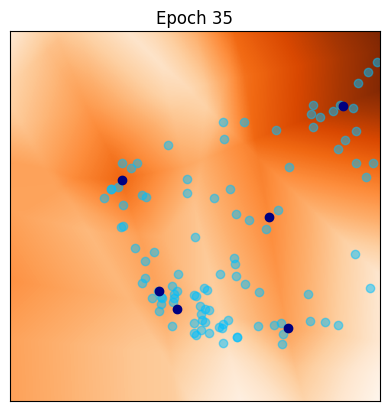

[36/100] 	Loss_D: -0.1002	Loss_G: -6.7955	Lip(D)=1.3745
[37/100] 	Loss_D: -0.0606	Loss_G: -7.4333	Lip(D)=1.3554
[38/100] 	Loss_D: -0.1026	Loss_G: -7.6531	Lip(D)=1.1385
[39/100] 	Loss_D: -0.0538	Loss_G: -7.3435	Lip(D)=1.1787
[40/100] 	Loss_D: -0.0900	Loss_G: -7.1704	Lip(D)=1.4687


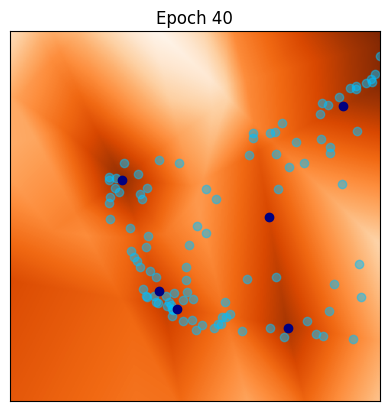

[41/100] 	Loss_D: -0.0886	Loss_G: -7.3790	Lip(D)=1.1163
[42/100] 	Loss_D: -0.0821	Loss_G: -7.4517	Lip(D)=1.0819
[43/100] 	Loss_D: -0.0817	Loss_G: -7.6594	Lip(D)=1.8135
[44/100] 	Loss_D: -0.0935	Loss_G: -7.2102	Lip(D)=1.3846
[45/100] 	Loss_D: -0.0810	Loss_G: -7.4586	Lip(D)=1.3697


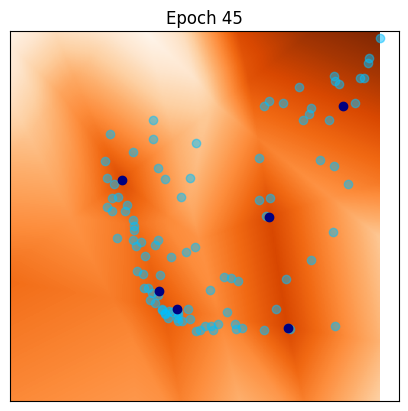

[46/100] 	Loss_D: -0.0642	Loss_G: -8.1031	Lip(D)=1.3578
[47/100] 	Loss_D: -0.0953	Loss_G: -9.1009	Lip(D)=1.4520
[48/100] 	Loss_D: -0.1111	Loss_G: -10.2228	Lip(D)=1.1050
[49/100] 	Loss_D: -0.0974	Loss_G: -10.3483	Lip(D)=1.5150
[50/100] 	Loss_D: -0.1116	Loss_G: -9.7792	Lip(D)=1.3318


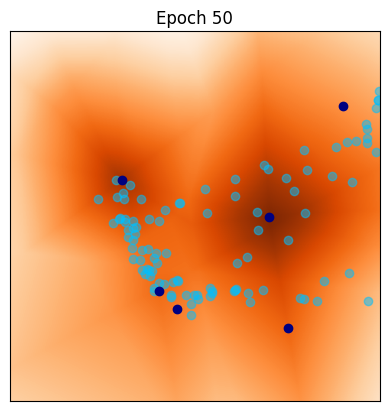

[51/100] 	Loss_D: -0.1392	Loss_G: -9.5903	Lip(D)=1.5987
[52/100] 	Loss_D: -0.1076	Loss_G: -10.9378	Lip(D)=1.5033
[53/100] 	Loss_D: -0.0448	Loss_G: -10.3231	Lip(D)=1.3708
[54/100] 	Loss_D: -0.0901	Loss_G: -9.4256	Lip(D)=1.5898
[55/100] 	Loss_D: -0.1315	Loss_G: -7.3905	Lip(D)=1.3373


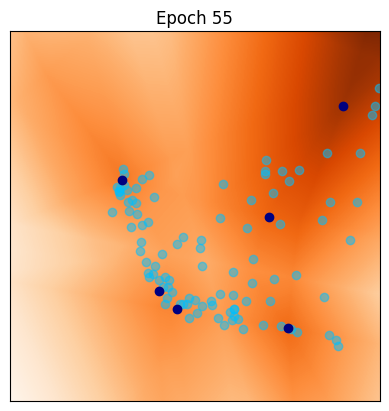

[56/100] 	Loss_D: -0.0774	Loss_G: -5.9369	Lip(D)=1.2213
[57/100] 	Loss_D: -0.0769	Loss_G: -7.7300	Lip(D)=1.2778
[58/100] 	Loss_D: -0.0790	Loss_G: -9.2877	Lip(D)=1.4070
[59/100] 	Loss_D: -0.0724	Loss_G: -7.1335	Lip(D)=1.3234
[60/100] 	Loss_D: -0.1335	Loss_G: -5.4115	Lip(D)=1.3280


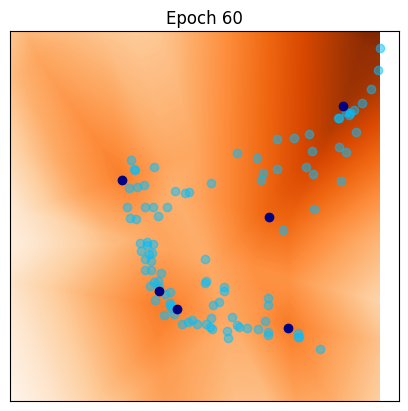

[61/100] 	Loss_D: -0.0857	Loss_G: -6.5811	Lip(D)=1.5043
[62/100] 	Loss_D: -0.0736	Loss_G: -7.8513	Lip(D)=1.3449
[63/100] 	Loss_D: -0.0830	Loss_G: -6.6968	Lip(D)=1.5186
[64/100] 	Loss_D: -0.1221	Loss_G: -5.0365	Lip(D)=1.3319
[65/100] 	Loss_D: -0.1151	Loss_G: -5.2522	Lip(D)=1.1659


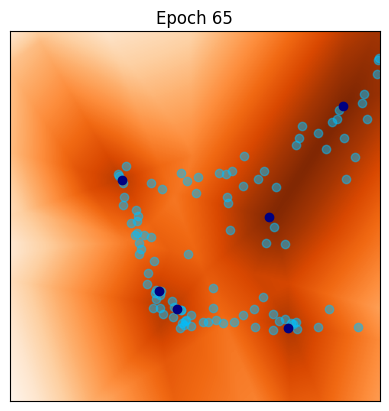

[66/100] 	Loss_D: -0.1003	Loss_G: -7.0168	Lip(D)=1.3169
[67/100] 	Loss_D: -0.0814	Loss_G: -5.8999	Lip(D)=1.4585
[68/100] 	Loss_D: -0.0910	Loss_G: -5.1384	Lip(D)=1.3332
[69/100] 	Loss_D: -0.0873	Loss_G: -4.5723	Lip(D)=1.3363
[70/100] 	Loss_D: -0.0966	Loss_G: -4.9990	Lip(D)=1.3141


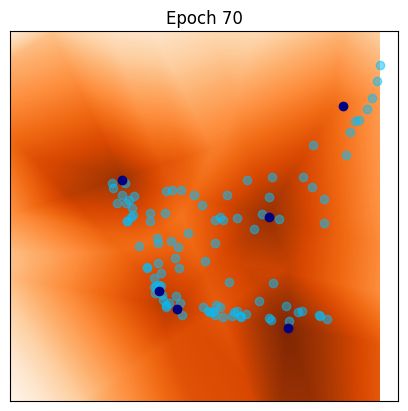

[71/100] 	Loss_D: -0.0962	Loss_G: -7.7559	Lip(D)=1.1900
[72/100] 	Loss_D: -0.0737	Loss_G: -8.9972	Lip(D)=1.2828
[73/100] 	Loss_D: -0.1015	Loss_G: -5.6861	Lip(D)=1.1673
[74/100] 	Loss_D: -0.0903	Loss_G: -5.1636	Lip(D)=1.3746
[75/100] 	Loss_D: -0.0802	Loss_G: -12.9960	Lip(D)=1.4398


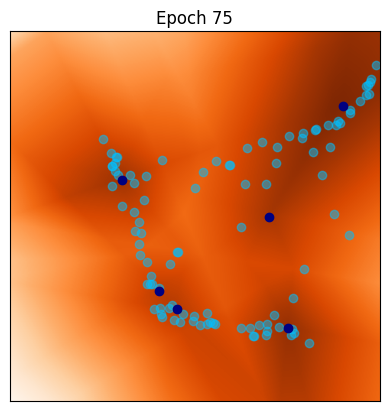

[76/100] 	Loss_D: -0.0633	Loss_G: -10.2822	Lip(D)=1.5474
[77/100] 	Loss_D: -0.0880	Loss_G: -9.1809	Lip(D)=1.2654
[78/100] 	Loss_D: -0.0807	Loss_G: -10.8386	Lip(D)=1.4030
[79/100] 	Loss_D: -0.0926	Loss_G: -9.0505	Lip(D)=1.0942
[80/100] 	Loss_D: -0.0801	Loss_G: -7.2282	Lip(D)=1.0329


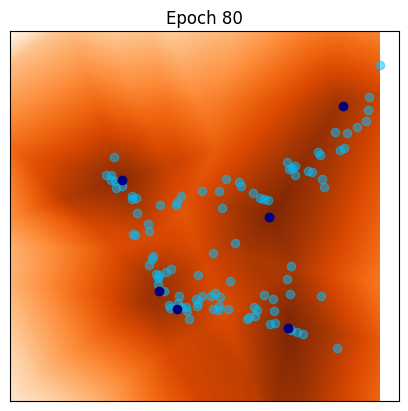

[81/100] 	Loss_D: -0.0808	Loss_G: -11.0948	Lip(D)=1.1765
[82/100] 	Loss_D: -0.0839	Loss_G: -6.2624	Lip(D)=1.2125
[83/100] 	Loss_D: -0.0852	Loss_G: -7.0263	Lip(D)=1.2765
[84/100] 	Loss_D: -0.1049	Loss_G: -18.6422	Lip(D)=1.0882
[85/100] 	Loss_D: -0.0871	Loss_G: -15.1916	Lip(D)=1.4102


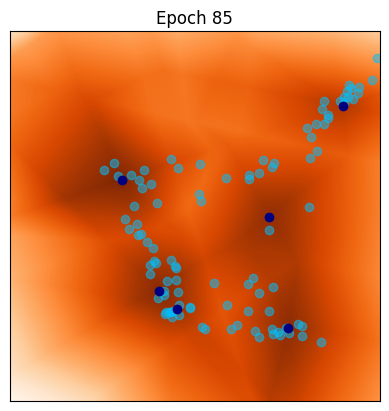

[86/100] 	Loss_D: -0.1037	Loss_G: -14.5472	Lip(D)=1.4303
[87/100] 	Loss_D: -0.0950	Loss_G: -17.5167	Lip(D)=1.4672
[88/100] 	Loss_D: -0.1031	Loss_G: -16.8606	Lip(D)=1.4353
[89/100] 	Loss_D: -0.0856	Loss_G: -15.2939	Lip(D)=1.3718
[90/100] 	Loss_D: -0.1020	Loss_G: -17.9919	Lip(D)=1.2488


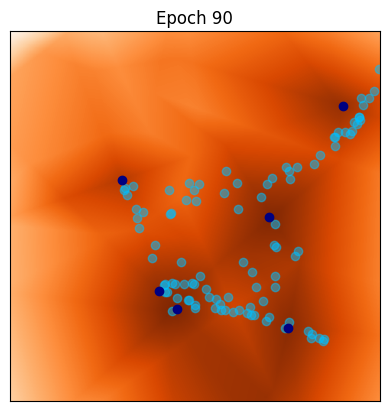

[91/100] 	Loss_D: -0.0908	Loss_G: -17.1019	Lip(D)=0.9260
[92/100] 	Loss_D: -0.1120	Loss_G: -14.3885	Lip(D)=1.5147
[93/100] 	Loss_D: -0.0787	Loss_G: -15.8386	Lip(D)=1.3199
[94/100] 	Loss_D: -0.0969	Loss_G: -18.0783	Lip(D)=1.4613
[95/100] 	Loss_D: -0.1007	Loss_G: -16.6521	Lip(D)=1.3003


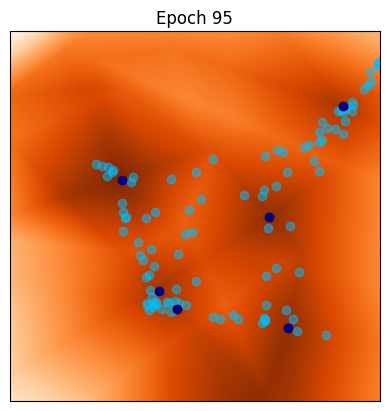

[96/100] 	Loss_D: -0.0982	Loss_G: -14.9124	Lip(D)=1.3332
[97/100] 	Loss_D: -0.1052	Loss_G: -17.9854	Lip(D)=1.4398
[98/100] 	Loss_D: -0.0922	Loss_G: -18.5375	Lip(D)=1.2994
[99/100] 	Loss_D: -0.0722	Loss_G: -15.9135	Lip(D)=1.4201


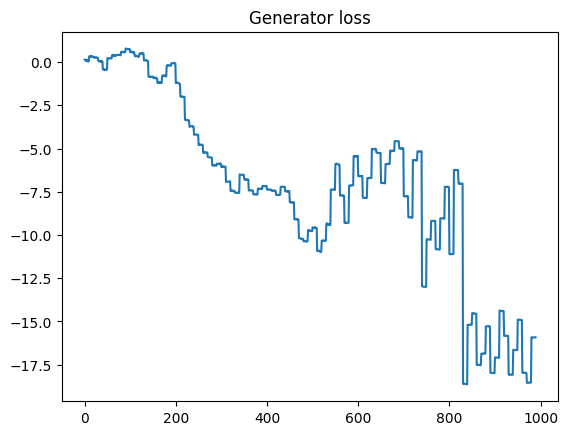

<All keys matched successfully>

In [ ]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=10
gpw = .1

lr = 0.002      # learning rate for generator
lrdisc = 0.002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1, n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################
    for iter in range(0, niterD):
        # Update discriminator
        optimD.zero_grad()
        # Generate fake data
        z = torch.randn(b, n_in, device=device)
        x_fake = G(z)
        # Compute WGAN loss for fake data
        D_fake = D(x_fake)
        D_fake_mean = torch.mean(D_fake)
        # Compute WGAN loss for real data
        x_real = y
        D_real = D(x_real)
        D_real_mean = torch.mean(D_real)
        # Compute total discriminator loss
        Dloss = D_fake_mean - D_real_mean
        # Gradient Penalty
        gp = gradient_penalty(D, x_real, x_fake)
        Dloss += gp * gpw
        # Backpropagation and optimization
        Dloss.backward()
        optimD.step()
        # SAVE LOSS
        Dlosst = Dloss.item()
        Dlosses.append(-Dlosst)

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0, niterG):
        # Update generator
        optimG.zero_grad()
        # Generate fake data
        z = torch.randn(b, n_in, device=device)
        x_fake = G(z)
        # Compute generator loss
        D_fake = D(x_fake)
        Gloss = -torch.mean(D_fake)
        # Backpropagation and optimization
        Gloss.backward()
        optimG.step()
        # SAVE LOSS
        Glosses.append(Gloss.item())

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
          % (epoch, n_epochs, Dloss.item(), Gloss.item(), lipconstant(D, x_real, x_fake).item()))

    if epoch % iter_display == 0:
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch ' + str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

## Sensitivy to hyper-parameters

QUESTION: Repeat the WGAN learning experiment, by changing the parameters of the optimization (learning rates, number of updates of D and G, etc).

From your experiments, can you draw a few recommendations for stable training?

**Answer:** From the experiments, several observations can be made to ensure stable WGAN training:

### Number of epochs:
Too many epochs mayresult in the model overfitting and in the toher case it may lead to underfitting. around 10 epochs seems to be a good trade-off

### Learning Rates:

Discriminator Learning Rate: Typically set to 0.0002. A too high learning rate may lead to unstable training, while too low may slow down convergence.
Generator Learning Rate: Often set similarly to the discriminator (0.0002). Adjusting this rate may balance the competition between the generator and the discriminator.
### Number of Updates:

Discriminator Updates (niterD): Updating the discriminator multiple times (e.g., 5 updates) for every generator update can help the discriminator to stay ahead in the learning process, stabilizing the GAN.
Generator Updates (niterG): Usually fewer updates than the discriminator (e.g., 1 update) to prevent the generator from overpowering the discriminator.
### Gradient Penalty Weight (gpw):

The gradient penalty weight (often set to 10) helps enforce the Lipschitz constraint. Adjusting this value can influence the discriminator's gradient norm and stability of the training.

### Optimizer Parameters:

Betas (beta1, beta2): Setting beta1 to 0.5 and beta2 to 0.999 works well for Adam optimizer, providing a balance between bias correction and momentum.

[1/100] 	Loss_D: 0.0282	Loss_G: 1.1113	Lip(D)=0.8292
[2/100] 	Loss_D: -0.2311	Loss_G: -0.1403	Lip(D)=1.4255
[3/100] 	Loss_D: -0.0436	Loss_G: 0.0173	Lip(D)=1.0292
[4/100] 	Loss_D: -0.0694	Loss_G: 1.6302	Lip(D)=1.0973
[5/100] 	Loss_D: -0.0395	Loss_G: 0.7712	Lip(D)=1.0935


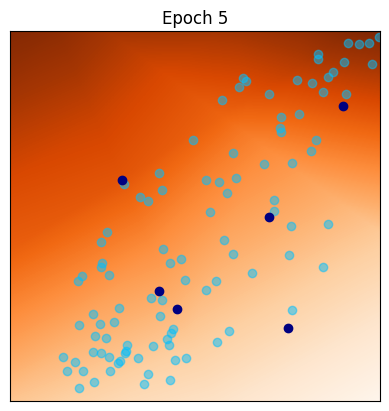

[6/100] 	Loss_D: -0.0569	Loss_G: -0.0132	Lip(D)=0.6819
[7/100] 	Loss_D: -0.1974	Loss_G: -1.0053	Lip(D)=1.4621
[8/100] 	Loss_D: -0.0372	Loss_G: -0.6957	Lip(D)=1.0992
[9/100] 	Loss_D: -0.1231	Loss_G: 0.1784	Lip(D)=1.1236
[10/100] 	Loss_D: -0.1206	Loss_G: 0.1600	Lip(D)=1.3706


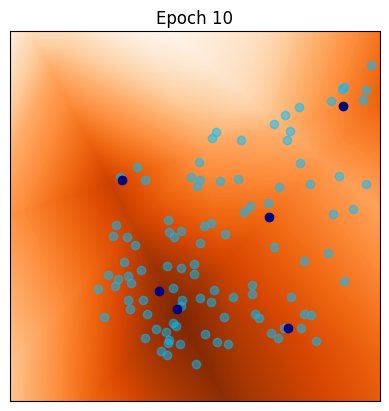

[11/100] 	Loss_D: -0.0901	Loss_G: 0.3270	Lip(D)=1.2669
[12/100] 	Loss_D: -0.0666	Loss_G: 0.3023	Lip(D)=1.2512
[13/100] 	Loss_D: -0.0689	Loss_G: 0.2704	Lip(D)=1.1805
[14/100] 	Loss_D: -0.0590	Loss_G: 0.4106	Lip(D)=1.3319
[15/100] 	Loss_D: -0.0633	Loss_G: 0.1376	Lip(D)=1.2939


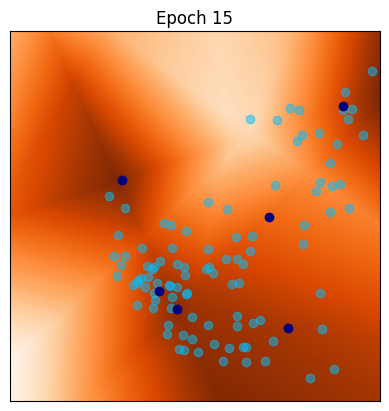

[16/100] 	Loss_D: -0.1003	Loss_G: 0.5731	Lip(D)=1.0691
[17/100] 	Loss_D: -0.0827	Loss_G: 0.1846	Lip(D)=1.2416
[18/100] 	Loss_D: -0.0878	Loss_G: 0.5324	Lip(D)=1.1498
[19/100] 	Loss_D: -0.0800	Loss_G: 0.1147	Lip(D)=1.2804
[20/100] 	Loss_D: -0.0604	Loss_G: 0.2544	Lip(D)=1.3176


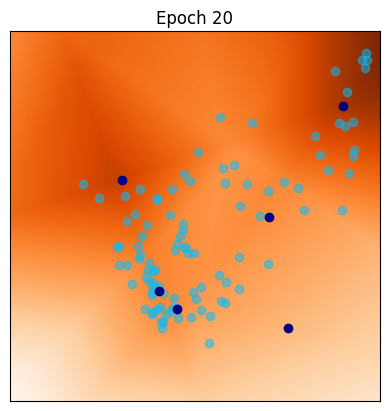

[21/100] 	Loss_D: -0.0830	Loss_G: 0.1369	Lip(D)=1.3972
[22/100] 	Loss_D: -0.0712	Loss_G: 0.2426	Lip(D)=1.3121
[23/100] 	Loss_D: -0.0291	Loss_G: 0.0884	Lip(D)=1.0288
[24/100] 	Loss_D: -0.1248	Loss_G: 0.0981	Lip(D)=1.3313
[25/100] 	Loss_D: -0.0579	Loss_G: 0.1011	Lip(D)=1.2946


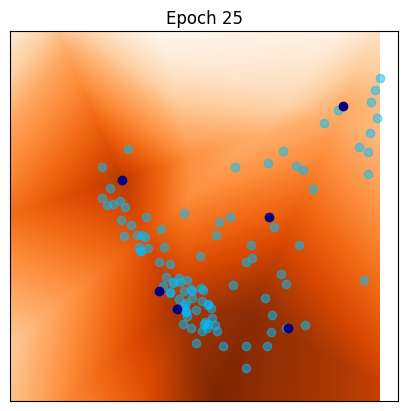

[26/100] 	Loss_D: -0.0688	Loss_G: 0.1074	Lip(D)=1.1235
[27/100] 	Loss_D: -0.0850	Loss_G: 0.1323	Lip(D)=1.2590
[28/100] 	Loss_D: -0.0691	Loss_G: 0.3163	Lip(D)=1.1950
[29/100] 	Loss_D: -0.0976	Loss_G: 0.4071	Lip(D)=1.5003
[30/100] 	Loss_D: -0.0804	Loss_G: 0.4241	Lip(D)=1.3592


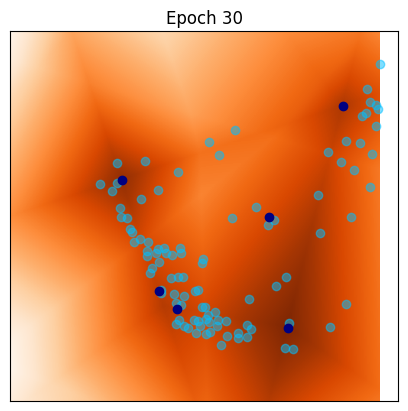

[31/100] 	Loss_D: -0.0665	Loss_G: 0.4113	Lip(D)=1.4619
[32/100] 	Loss_D: -0.0714	Loss_G: 0.3597	Lip(D)=1.4111
[33/100] 	Loss_D: -0.0755	Loss_G: 0.2975	Lip(D)=1.3225
[34/100] 	Loss_D: -0.0920	Loss_G: 0.2439	Lip(D)=1.1201
[35/100] 	Loss_D: -0.0751	Loss_G: 0.0509	Lip(D)=1.5496


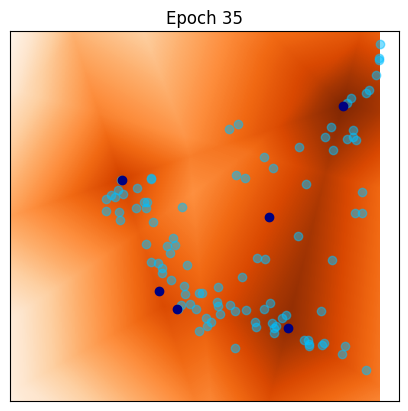

[36/100] 	Loss_D: -0.0739	Loss_G: 0.0383	Lip(D)=1.2596
[37/100] 	Loss_D: -0.0917	Loss_G: -0.0241	Lip(D)=1.4240
[38/100] 	Loss_D: -0.0831	Loss_G: 0.0398	Lip(D)=1.2212
[39/100] 	Loss_D: -0.0816	Loss_G: -0.0717	Lip(D)=1.4681
[40/100] 	Loss_D: -0.1010	Loss_G: -0.0054	Lip(D)=1.4250


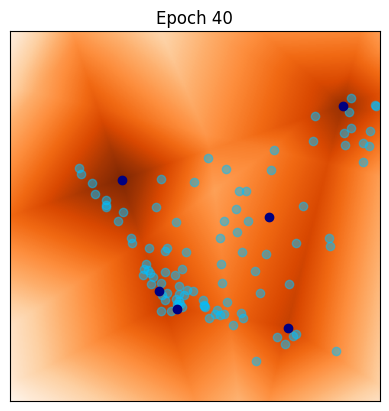

[41/100] 	Loss_D: -0.0752	Loss_G: -0.1696	Lip(D)=1.2139
[42/100] 	Loss_D: -0.0739	Loss_G: -0.1144	Lip(D)=1.2363
[43/100] 	Loss_D: -0.0752	Loss_G: -0.2265	Lip(D)=1.3355
[44/100] 	Loss_D: -0.0746	Loss_G: -0.1264	Lip(D)=1.2786
[45/100] 	Loss_D: -0.0641	Loss_G: -0.2739	Lip(D)=1.4271


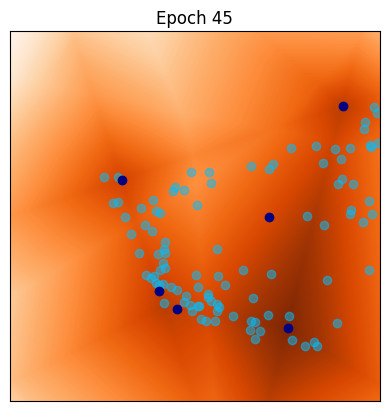

[46/100] 	Loss_D: -0.0917	Loss_G: -0.1026	Lip(D)=1.3984
[47/100] 	Loss_D: -0.0916	Loss_G: -0.3124	Lip(D)=1.3120
[48/100] 	Loss_D: -0.0689	Loss_G: -0.1539	Lip(D)=1.5060
[49/100] 	Loss_D: -0.0639	Loss_G: -0.3487	Lip(D)=1.3316
[50/100] 	Loss_D: -0.0472	Loss_G: -0.2188	Lip(D)=1.3636


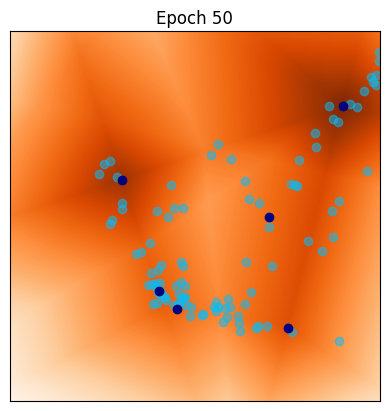

[51/100] 	Loss_D: -0.0623	Loss_G: -0.4030	Lip(D)=1.3104
[52/100] 	Loss_D: -0.0851	Loss_G: -0.3063	Lip(D)=1.3148
[53/100] 	Loss_D: -0.0848	Loss_G: -0.4446	Lip(D)=1.2963
[54/100] 	Loss_D: -0.0798	Loss_G: -0.3400	Lip(D)=1.1353
[55/100] 	Loss_D: -0.0868	Loss_G: -0.5625	Lip(D)=1.3634


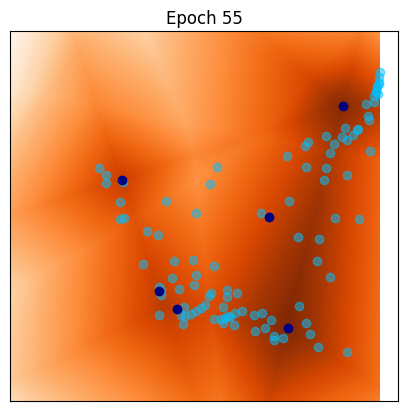

[56/100] 	Loss_D: -0.0729	Loss_G: -0.4724	Lip(D)=1.3673
[57/100] 	Loss_D: -0.0717	Loss_G: -0.6341	Lip(D)=1.3971
[58/100] 	Loss_D: -0.0592	Loss_G: -0.5448	Lip(D)=1.3692
[59/100] 	Loss_D: -0.0700	Loss_G: -0.7192	Lip(D)=1.2848
[60/100] 	Loss_D: -0.0662	Loss_G: -0.6507	Lip(D)=1.2157


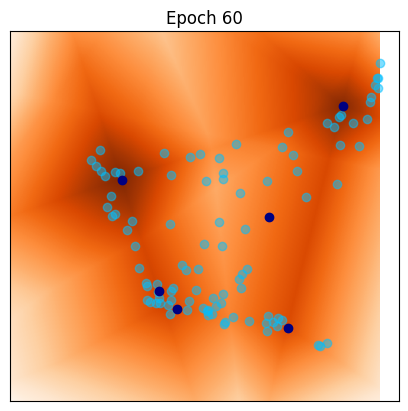

[61/100] 	Loss_D: -0.0716	Loss_G: -0.8154	Lip(D)=1.3285
[62/100] 	Loss_D: -0.1028	Loss_G: -0.7287	Lip(D)=1.2574
[63/100] 	Loss_D: -0.0816	Loss_G: -0.9052	Lip(D)=1.4038
[64/100] 	Loss_D: -0.0855	Loss_G: -0.7915	Lip(D)=1.5242
[65/100] 	Loss_D: -0.0629	Loss_G: -1.0358	Lip(D)=1.3527


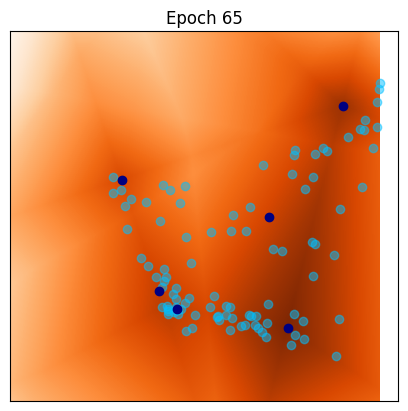

[66/100] 	Loss_D: -0.0866	Loss_G: -0.8742	Lip(D)=1.3457
[67/100] 	Loss_D: -0.0915	Loss_G: -1.1078	Lip(D)=1.0679
[68/100] 	Loss_D: -0.1273	Loss_G: -0.9579	Lip(D)=1.3750
[69/100] 	Loss_D: -0.0892	Loss_G: -1.2212	Lip(D)=1.3400
[70/100] 	Loss_D: -0.0832	Loss_G: -1.0063	Lip(D)=1.7887


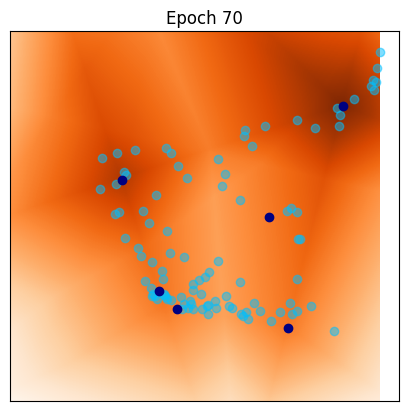

[71/100] 	Loss_D: -0.0691	Loss_G: -1.4062	Lip(D)=1.3452
[72/100] 	Loss_D: -0.0940	Loss_G: -1.0216	Lip(D)=1.2253
[73/100] 	Loss_D: -0.0812	Loss_G: -1.5449	Lip(D)=1.2703
[74/100] 	Loss_D: -0.1340	Loss_G: -1.1064	Lip(D)=1.2050
[75/100] 	Loss_D: -0.0814	Loss_G: -1.6541	Lip(D)=1.3051


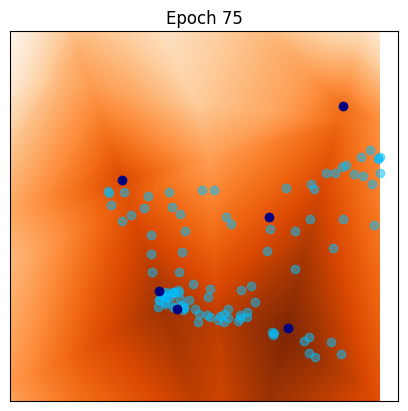

[76/100] 	Loss_D: -0.0893	Loss_G: -1.1662	Lip(D)=1.4031
[77/100] 	Loss_D: -0.0734	Loss_G: -1.7402	Lip(D)=1.3447
[78/100] 	Loss_D: -0.1882	Loss_G: -0.8363	Lip(D)=1.9353
[79/100] 	Loss_D: -0.1085	Loss_G: -1.8877	Lip(D)=1.4159
[80/100] 	Loss_D: -0.1363	Loss_G: -0.8232	Lip(D)=1.1205


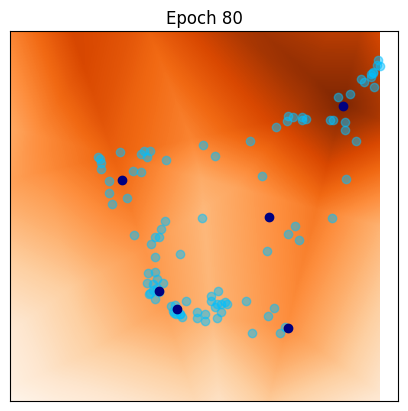

[81/100] 	Loss_D: -0.0916	Loss_G: -1.4149	Lip(D)=1.5206
[82/100] 	Loss_D: -0.0773	Loss_G: -1.0856	Lip(D)=1.3429
[83/100] 	Loss_D: -0.0956	Loss_G: -1.3805	Lip(D)=1.2716
[84/100] 	Loss_D: -0.0488	Loss_G: -1.3267	Lip(D)=1.1505
[85/100] 	Loss_D: -0.0554	Loss_G: -1.4920	Lip(D)=1.2151


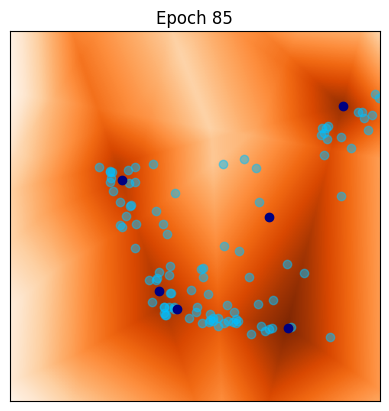

[86/100] 	Loss_D: -0.0720	Loss_G: -1.4686	Lip(D)=1.2388
[87/100] 	Loss_D: -0.0542	Loss_G: -1.6051	Lip(D)=1.4408
[88/100] 	Loss_D: -0.0697	Loss_G: -1.6381	Lip(D)=1.3133
[89/100] 	Loss_D: -0.0554	Loss_G: -1.7215	Lip(D)=1.1274
[90/100] 	Loss_D: -0.0629	Loss_G: -1.7551	Lip(D)=1.1206


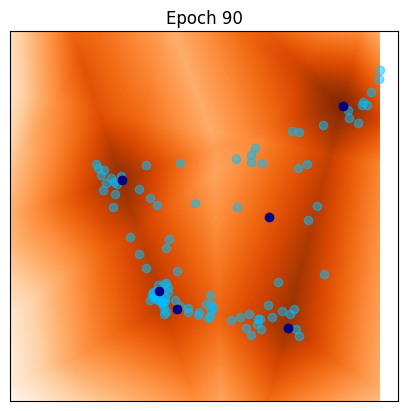

[91/100] 	Loss_D: -0.0511	Loss_G: -1.8297	Lip(D)=1.1825
[92/100] 	Loss_D: -0.0574	Loss_G: -1.8343	Lip(D)=1.2582
[93/100] 	Loss_D: -0.0625	Loss_G: -1.9255	Lip(D)=1.2605
[94/100] 	Loss_D: -0.0342	Loss_G: -1.9254	Lip(D)=1.3104
[95/100] 	Loss_D: -0.0650	Loss_G: -2.0809	Lip(D)=1.2552


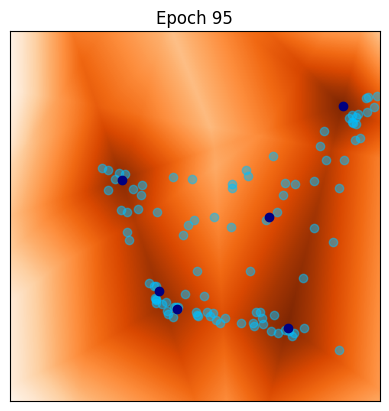

[96/100] 	Loss_D: -0.0779	Loss_G: -2.0425	Lip(D)=1.2888
[97/100] 	Loss_D: -0.0814	Loss_G: -2.2405	Lip(D)=1.2020
[98/100] 	Loss_D: -0.0525	Loss_G: -2.1423	Lip(D)=1.0449
[99/100] 	Loss_D: -0.0793	Loss_G: -2.4247	Lip(D)=1.2597


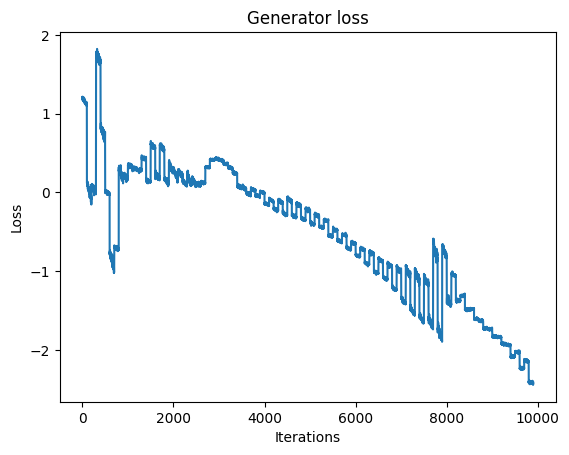

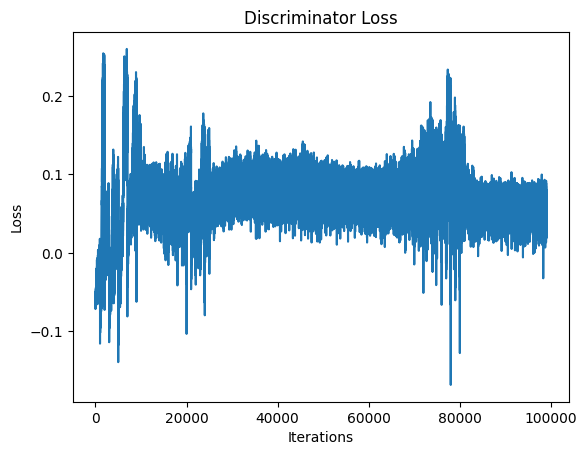

<All keys matched successfully>

In [ ]:
### ... ###
## parameters for training
n_epochs = 100
niterD=1000
niterG=100
gpw = .1

lr = 0.0002      # learning rate for generator
lrdisc = 0.0002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1, n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################
    for iter in range(0, niterD):
        # Update discriminator
        optimD.zero_grad()
        # Generate fake data
        z = torch.randn(b, n_in, device=device)
        x_fake = G(z)
        # Compute WGAN loss for fake data
        D_fake = D(x_fake)
        D_fake_mean = torch.mean(D_fake)
        # Compute WGAN loss for real data
        x_real = y
        D_real = D(x_real)
        D_real_mean = torch.mean(D_real)
        # Compute total discriminator loss
        Dloss = D_fake_mean - D_real_mean
        # Gradient Penalty
        gp = gradient_penalty(D, x_real, x_fake)
        Dloss += gp * gpw
        # Backpropagation and optimization
        Dloss.backward()
        optimD.step()
        # SAVE LOSS
        Dlosst = Dloss.item()
        Dlosses.append(-Dlosst)

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0, niterG):
        # Update generator
        optimG.zero_grad()
        # Generate fake data
        z = torch.randn(b, n_in, device=device)
        x_fake = G(z)
        # Compute generator loss
        D_fake = D(x_fake)
        Gloss = -torch.mean(D_fake)
        # Backpropagation and optimization
        Gloss.backward()
        optimG.step()
        # SAVE LOSS
        Glosses.append(Gloss.item())

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
          % (epoch, n_epochs, Dloss.item(), Gloss.item(), lipconstant(D, x_real, x_fake).item()))

    if epoch % iter_display == 0:
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch ' + str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

#plt.figure(dpi=100)
#plt.plot(Dlosses)
#plt.title('Discriminator Loss')
#plt.xlabel('Iterations')
#plt.ylabel('Loss')
#plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

## Train the generator only

QUESTION: For a fixed discriminator, optimize only the generator only. Can you explain what is happening then?

ANSWER:
When optimizing only the generator while keeping the discriminator fixed, we are essentially performing a form of supervised learning. The generator is trained to generate samples that are indistinguishable from real data according to the fixed discriminator.

However, the results are not that good since the discriminator acts also as a weight regulator because otherwise, we have the problems we can see in the graphics, the generator overfits and is not general enough.

Generator based Neural Networks - have no problem with creating overpopulated or staturated domain spaces.

The loss function in a GAN setup dynamically changes as the discriminator improves. This dynamic nature ensures that the generator is always being challenged by a progressively improving discriminator.

The discriminator acts as a guide for the generator to learn the true data distribution. The generator iteratively improves by minimizing the differences identified by the discriminator. This leads to better learning of the underlying data distribution compared to training without such guidance.

The adversarial training helps mitigate mode collapse, a common issue where the generator produces limited types of outputs. The discriminator penalizes the generator for producing similar outputs repeatedly, pushing the generator towards generating a wider variety of samples.

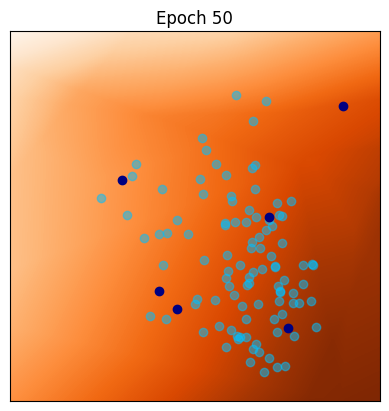

[Epoch 100/1000] Generator Loss: 0.1581


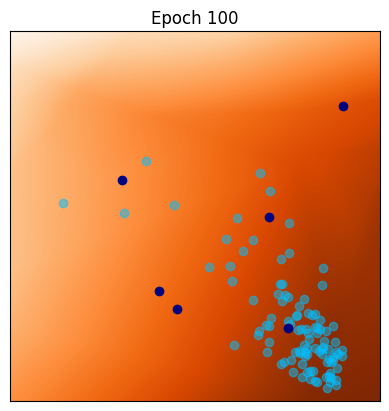

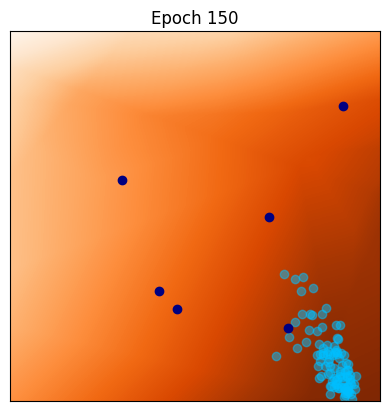

[Epoch 200/1000] Generator Loss: 0.1521


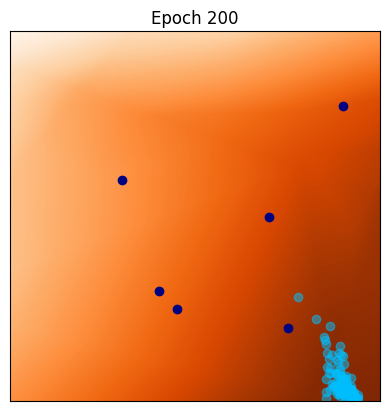

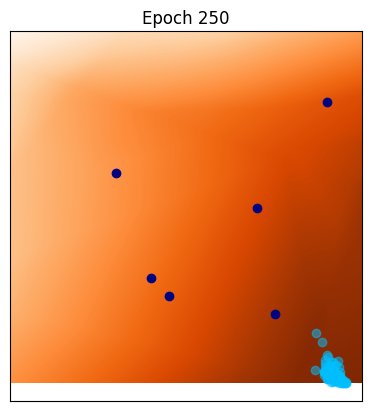

[Epoch 300/1000] Generator Loss: 0.1516


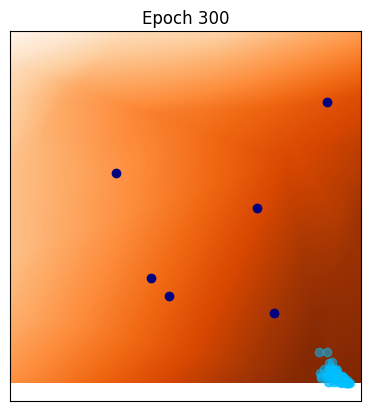

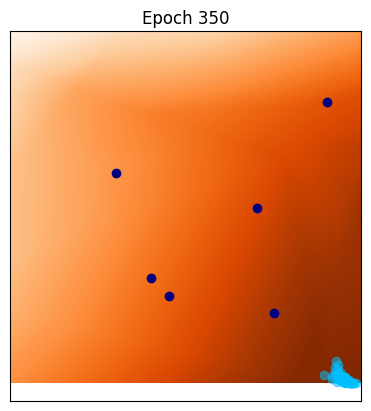

[Epoch 400/1000] Generator Loss: 0.1512


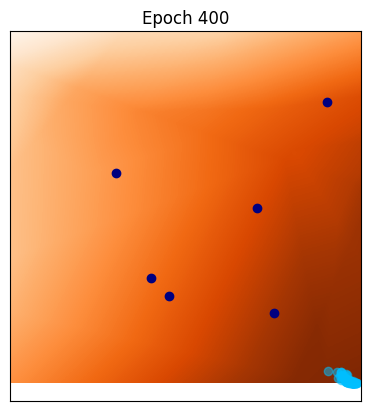

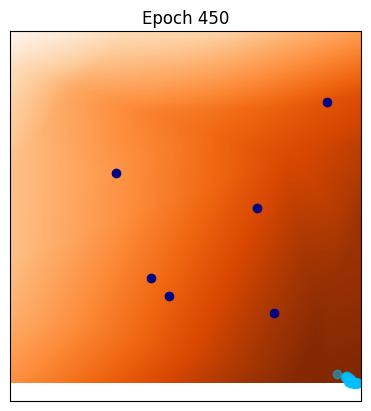

[Epoch 500/1000] Generator Loss: 0.1511


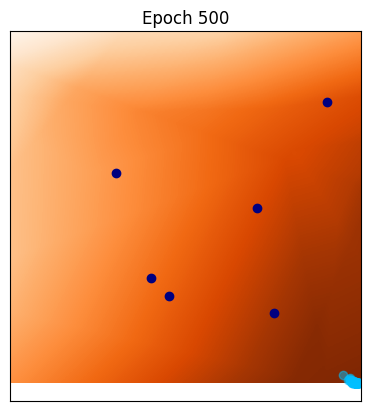

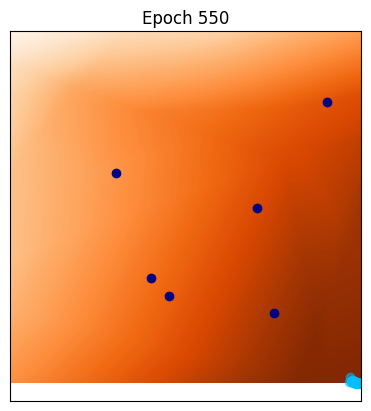

[Epoch 600/1000] Generator Loss: 0.1510


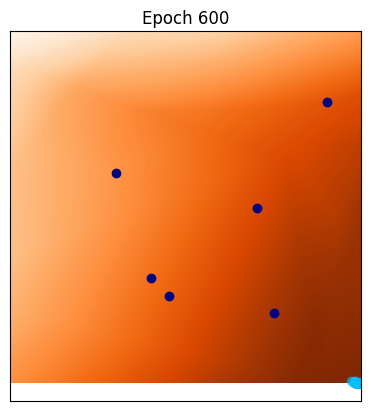

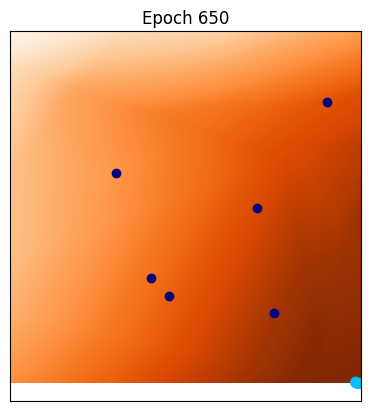

[Epoch 700/1000] Generator Loss: 0.1510


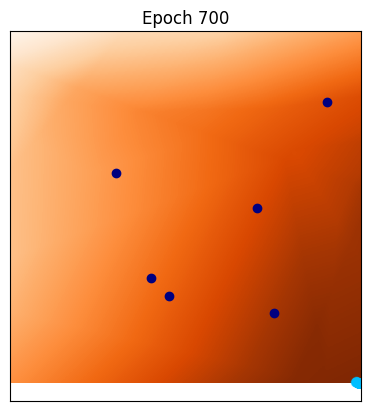

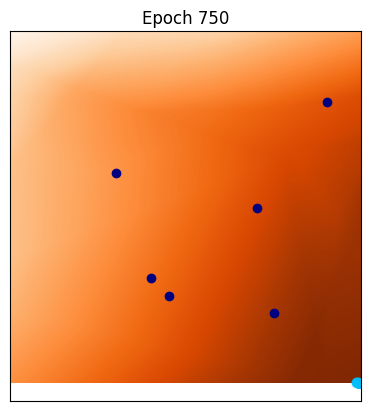

[Epoch 800/1000] Generator Loss: 0.1510


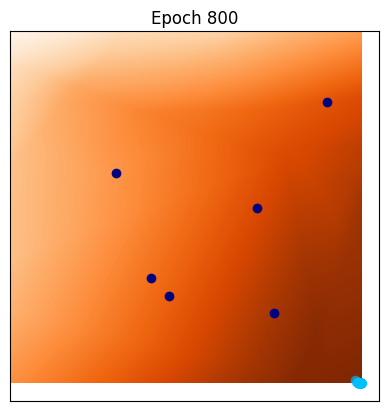

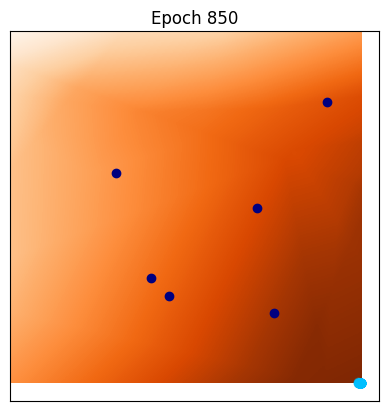

[Epoch 900/1000] Generator Loss: 0.1509


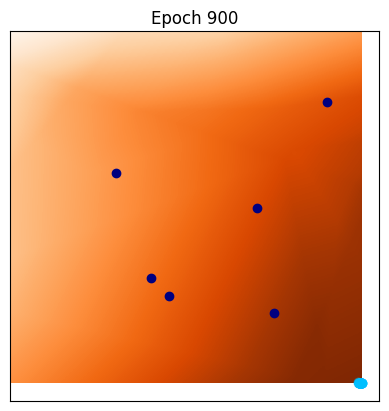

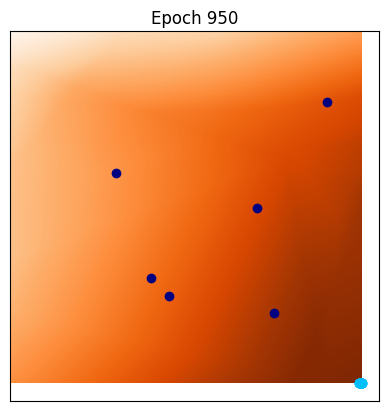

[Epoch 1000/1000] Generator Loss: 0.1509


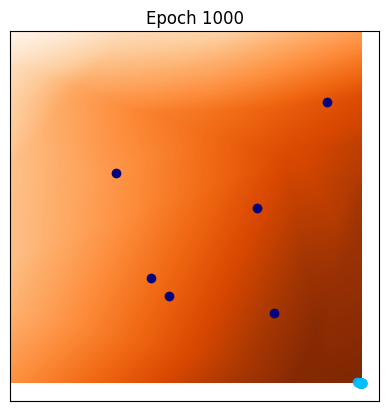

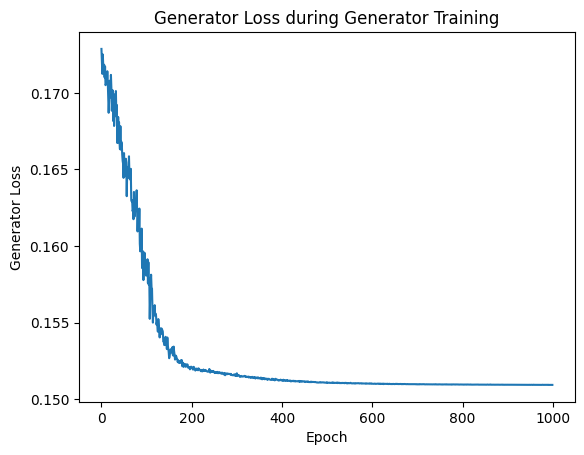

In [ ]:
# Set up fixed discriminator
D = Discriminator(n_in=d, n_hid=10).to(device)
D.eval()  # Ensure the discriminator is in evaluation mode (no parameter updates)

# Parameters for training the generator only
n_epochs_gen = 1000  # Number of epochs for generator training
lr_gen = 0.001       # Learning rate for the generator
b_gen = 64           # Batch size for generator training
iter_display_gen = 50

# Initialize generator
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr_gen)

Glosses_gen = []  # List to store generator loss during training

# Main loop for generator training
for epoch in range(1, n_epochs_gen + 1):
    # Generate fake data
    z = torch.randn(b_gen, n_in, device=device)
    x_fake = G(z)

    # Compute generator loss
    D_fake = D(x_fake)
    Gloss = -torch.mean(D_fake)  # Generator aims to fool the fixed discriminator

    # Backpropagation and optimization
    optimG.zero_grad()
    Gloss.backward()
    optimG.step()

    # Save generator loss
    Glosses_gen.append(Gloss.item())

    # Print progress
    if epoch % iter_display == 0:
        print('[Epoch %d/%d] Generator Loss: %.4f' % (epoch, n_epochs_gen, Gloss.item()))
    if epoch % iter_display_gen == 0:
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr, nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch ' + str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(strtitle)
        plt.show()

# Plot generator loss
plt.figure(dpi=100)
plt.plot(Glosses_gen)
plt.title('Generator Loss during Generator Training')
plt.xlabel('Epoch')
plt.ylabel('Generator Loss')
plt.show()


<br/><br/><br/><br/>

# BONUS Exercise (to do at home) : Learn a standard GAN

## Define Loss for GAN training

For stable GAN training uses the Binary cross-entropy loss which takes labeled data as input.

The data points $y$ should correspond to values $\approx 1$, whereas fake points $x$ should get values $\approx 0$.

We also introduce the sigmoid function. for displaying purpose: for GAN training, the discriminator values in $[0,1]$ will be obtained by applying after $D$.

In [ ]:
criterion = nn.BCEWithLogitsLoss()
V1 = torch.full((n,1), 1. , dtype=torch.float, device=device)
V0 = torch.full((b,1), 0. , dtype=torch.float, device=device)

sig = nn.Sigmoid()

lr = 0.001

## Train the discriminator for a fixed generator

QUESTION: Complete the following code at the blocks ###...###

[0/1000], 1.505573


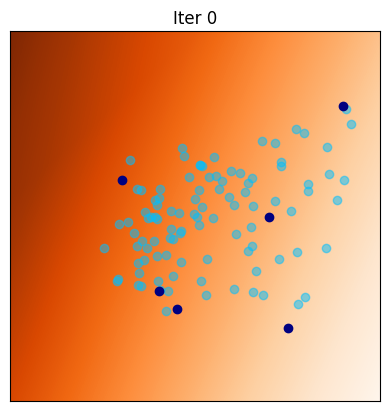

[100/1000], 1.371901


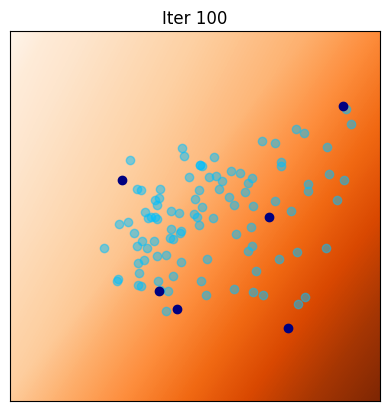

[200/1000], 1.336828


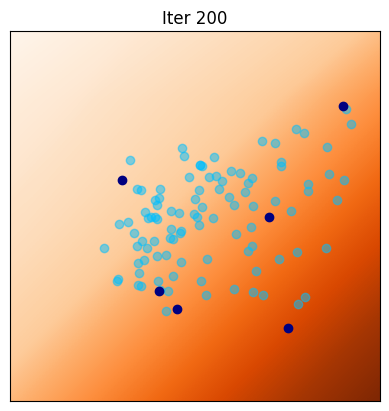

[300/1000], 1.288211


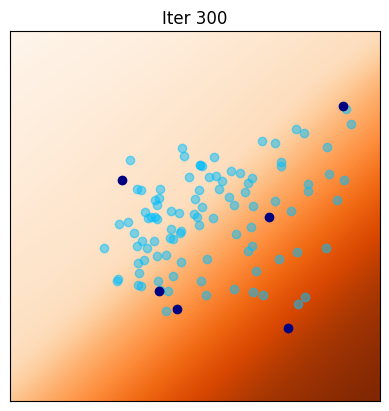

[400/1000], 1.242053


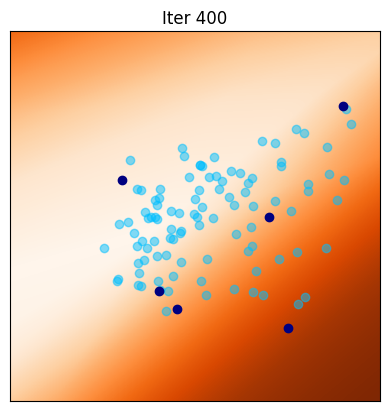

[500/1000], 1.163281


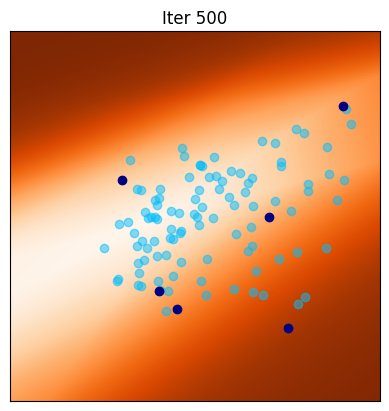

[600/1000], 1.007999


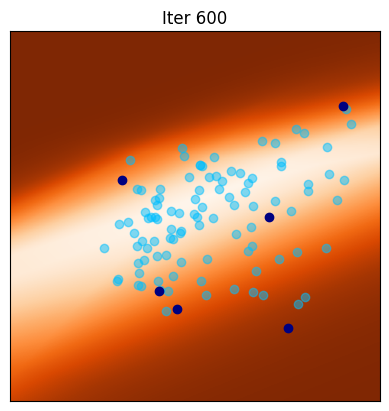

[700/1000], 0.928091


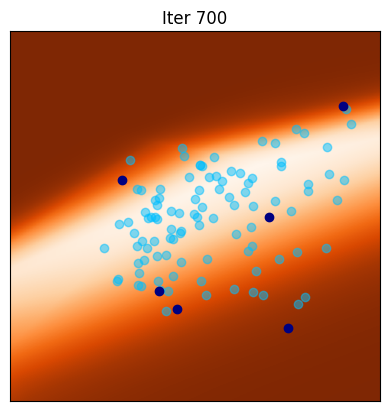

[800/1000], 0.884381


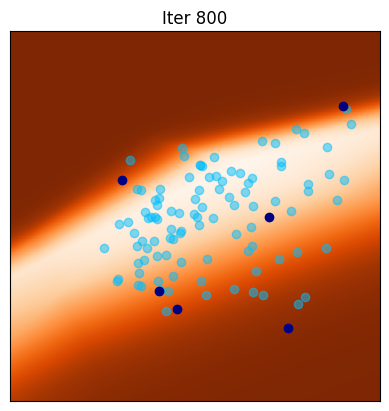

[900/1000], 0.859532


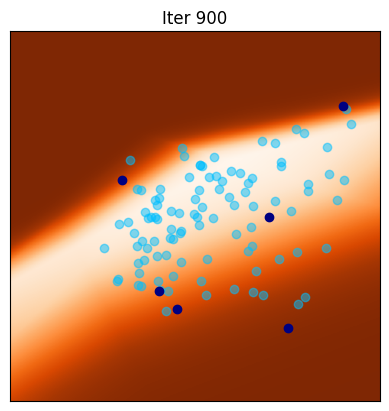

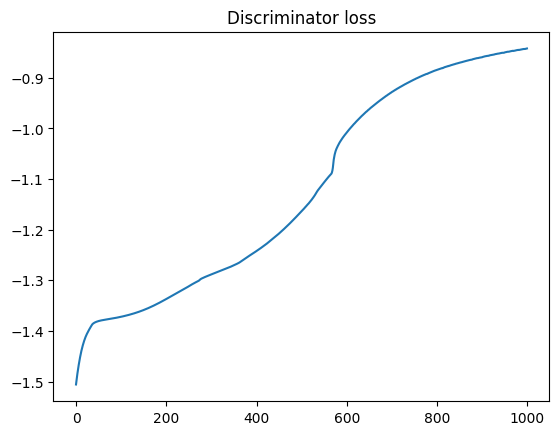

In [ ]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, 0.999))

iter_display = 100  # display current configuration each iter_display iteration

Dlosses = []

for iter in range(0,niterD):

    ### UPDATE OF D ###
    optimD.zero_grad()

    # Generate fake data
    fake_data = G(z).detach()

    # Calculate probabilities for real and fake data
    D_fake = D(fake_data)
    D_real = D(y)

    # Loss for discriminator
    Dloss = criterion(D_real, V1) + criterion(D_fake, V0)

    # Backpropagation
    Dloss.backward()
    optimD.step()


    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if(iter%iter_display == 0):
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = sig(D(xgrid)).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


### Plot the evolution of the discriminator loss ###
plt.figure(dpi=100)
plt.plot(Dlosses)
plt.title('Discriminator loss')
plt.show()

## Train both the Generator and Discriminator

[0/100] 	Loss_D: 1.3837	Loss_G: 0.6725


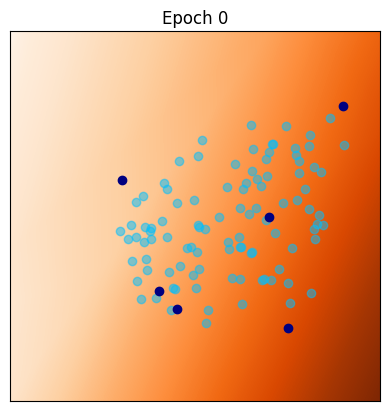

[1/100] 	Loss_D: 1.3802	Loss_G: 0.6978
[2/100] 	Loss_D: 1.3656	Loss_G: 0.6996
[3/100] 	Loss_D: 1.3709	Loss_G: 0.6904
[4/100] 	Loss_D: 1.3636	Loss_G: 0.6786
[5/100] 	Loss_D: 1.3063	Loss_G: 0.6573
[6/100] 	Loss_D: 1.2983	Loss_G: 0.6210
[7/100] 	Loss_D: 1.2133	Loss_G: 0.6291
[8/100] 	Loss_D: 1.1832	Loss_G: 0.6398
[9/100] 	Loss_D: 1.2029	Loss_G: 0.5573
[10/100] 	Loss_D: 1.1153	Loss_G: 0.5442


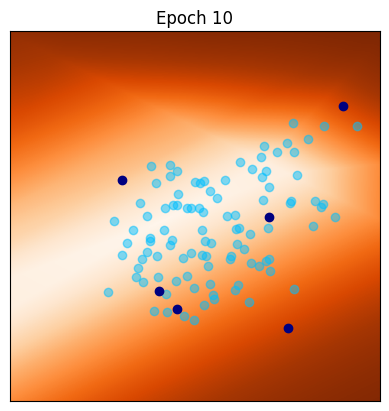

[11/100] 	Loss_D: 1.1110	Loss_G: 0.5227
[12/100] 	Loss_D: 1.0673	Loss_G: 0.4979
[13/100] 	Loss_D: 0.9661	Loss_G: 0.6215
[14/100] 	Loss_D: 0.9906	Loss_G: 0.5233
[15/100] 	Loss_D: 0.9219	Loss_G: 0.5477
[16/100] 	Loss_D: 0.9803	Loss_G: 0.4651
[17/100] 	Loss_D: 0.9799	Loss_G: 0.4349
[18/100] 	Loss_D: 0.9454	Loss_G: 0.5091
[19/100] 	Loss_D: 0.8871	Loss_G: 0.3952
[20/100] 	Loss_D: 0.8572	Loss_G: 0.4616


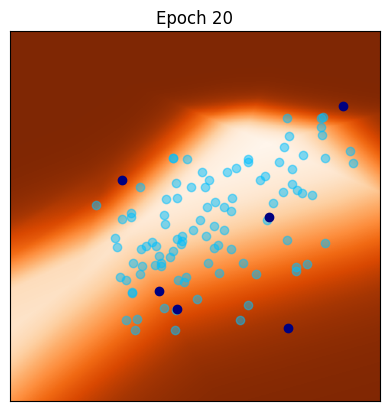

[21/100] 	Loss_D: 0.9396	Loss_G: 0.4060
[22/100] 	Loss_D: 0.8378	Loss_G: 0.4683
[23/100] 	Loss_D: 0.9503	Loss_G: 0.3756
[24/100] 	Loss_D: 0.9417	Loss_G: 0.3335
[25/100] 	Loss_D: 0.9146	Loss_G: 0.3911
[26/100] 	Loss_D: 0.9054	Loss_G: 0.4972
[27/100] 	Loss_D: 0.8717	Loss_G: 0.4462
[28/100] 	Loss_D: 0.8565	Loss_G: 0.3907
[29/100] 	Loss_D: 0.8892	Loss_G: 0.4171
[30/100] 	Loss_D: 0.8205	Loss_G: 0.5393


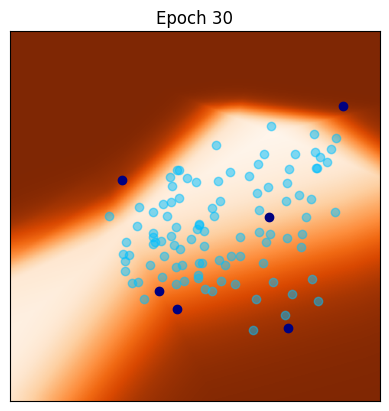

[31/100] 	Loss_D: 0.8234	Loss_G: 0.4337
[32/100] 	Loss_D: 0.8564	Loss_G: 0.4564
[33/100] 	Loss_D: 0.8717	Loss_G: 0.4512
[34/100] 	Loss_D: 0.9419	Loss_G: 0.4753
[35/100] 	Loss_D: 0.8384	Loss_G: 0.4102
[36/100] 	Loss_D: 1.0021	Loss_G: 0.3549
[37/100] 	Loss_D: 0.9455	Loss_G: 0.3591
[38/100] 	Loss_D: 0.8576	Loss_G: 0.3897
[39/100] 	Loss_D: 0.8178	Loss_G: 0.5014
[40/100] 	Loss_D: 0.7977	Loss_G: 0.5111


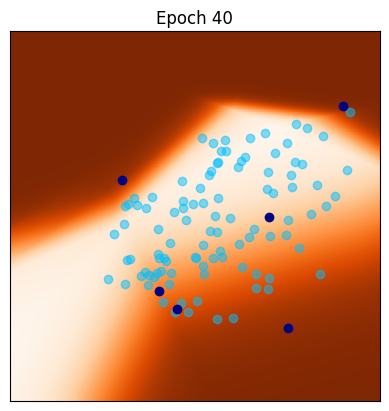

[41/100] 	Loss_D: 0.9552	Loss_G: 0.3324
[42/100] 	Loss_D: 0.8778	Loss_G: 0.4751
[43/100] 	Loss_D: 0.8459	Loss_G: 0.4350
[44/100] 	Loss_D: 0.8489	Loss_G: 0.3741
[45/100] 	Loss_D: 0.9298	Loss_G: 0.4341
[46/100] 	Loss_D: 0.8316	Loss_G: 0.4110
[47/100] 	Loss_D: 0.8619	Loss_G: 0.3335
[48/100] 	Loss_D: 0.8152	Loss_G: 0.4299
[49/100] 	Loss_D: 0.8610	Loss_G: 0.4005
[50/100] 	Loss_D: 0.7922	Loss_G: 0.3907


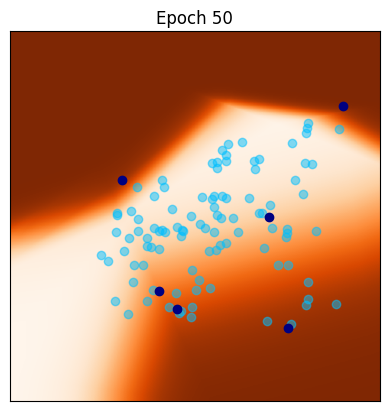

[51/100] 	Loss_D: 0.8663	Loss_G: 0.5583
[52/100] 	Loss_D: 0.8324	Loss_G: 0.5090
[53/100] 	Loss_D: 0.7968	Loss_G: 0.4547
[54/100] 	Loss_D: 0.8298	Loss_G: 0.5169
[55/100] 	Loss_D: 0.8143	Loss_G: 0.4063
[56/100] 	Loss_D: 0.8755	Loss_G: 0.3779
[57/100] 	Loss_D: 0.8426	Loss_G: 0.4140
[58/100] 	Loss_D: 0.9317	Loss_G: 0.3986
[59/100] 	Loss_D: 0.8522	Loss_G: 0.3577
[60/100] 	Loss_D: 0.9322	Loss_G: 0.3413


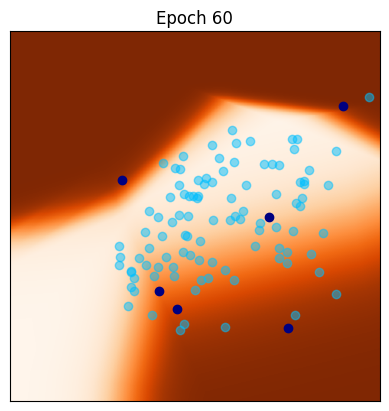

[61/100] 	Loss_D: 0.8070	Loss_G: 0.4622
[62/100] 	Loss_D: 0.8425	Loss_G: 0.4377
[63/100] 	Loss_D: 0.7643	Loss_G: 0.5253
[64/100] 	Loss_D: 0.8439	Loss_G: 0.4072
[65/100] 	Loss_D: 0.8247	Loss_G: 0.4376
[66/100] 	Loss_D: 0.8227	Loss_G: 0.4599
[67/100] 	Loss_D: 0.8467	Loss_G: 0.4065
[68/100] 	Loss_D: 0.8037	Loss_G: 0.4522
[69/100] 	Loss_D: 0.7997	Loss_G: 0.3251
[70/100] 	Loss_D: 0.8797	Loss_G: 0.4215


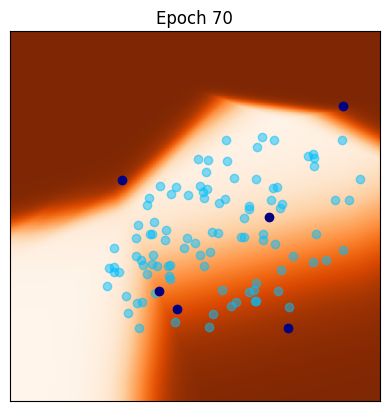

[71/100] 	Loss_D: 0.8486	Loss_G: 0.3763
[72/100] 	Loss_D: 0.8643	Loss_G: 0.3738
[73/100] 	Loss_D: 0.8135	Loss_G: 0.4134
[74/100] 	Loss_D: 0.8253	Loss_G: 0.4286
[75/100] 	Loss_D: 0.8374	Loss_G: 0.4346
[76/100] 	Loss_D: 0.8569	Loss_G: 0.3871
[77/100] 	Loss_D: 0.8735	Loss_G: 0.3760
[78/100] 	Loss_D: 0.8007	Loss_G: 0.3998
[79/100] 	Loss_D: 0.7932	Loss_G: 0.3730
[80/100] 	Loss_D: 0.7665	Loss_G: 0.4183


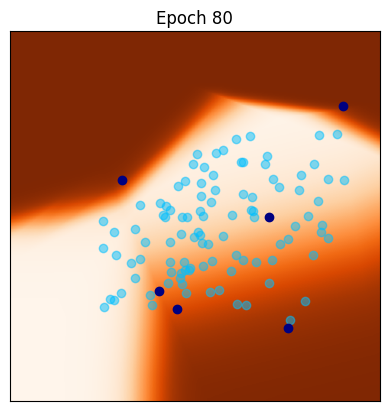

[81/100] 	Loss_D: 0.8610	Loss_G: 0.3301
[82/100] 	Loss_D: 0.8804	Loss_G: 0.3299
[83/100] 	Loss_D: 0.7856	Loss_G: 0.4259
[84/100] 	Loss_D: 0.8327	Loss_G: 0.3854
[85/100] 	Loss_D: 0.7918	Loss_G: 0.4732
[86/100] 	Loss_D: 0.7376	Loss_G: 0.4293
[87/100] 	Loss_D: 0.8577	Loss_G: 0.3720
[88/100] 	Loss_D: 0.7878	Loss_G: 0.3459
[89/100] 	Loss_D: 0.8799	Loss_G: 0.3142
[90/100] 	Loss_D: 0.7529	Loss_G: 0.3815


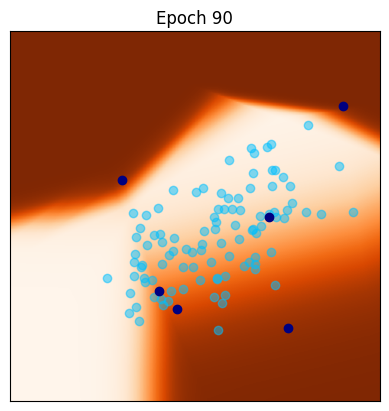

[91/100] 	Loss_D: 0.8302	Loss_G: 0.4194
[92/100] 	Loss_D: 0.8273	Loss_G: 0.4390
[93/100] 	Loss_D: 0.8417	Loss_G: 0.3597
[94/100] 	Loss_D: 0.8650	Loss_G: 0.4170
[95/100] 	Loss_D: 0.7974	Loss_G: 0.3894
[96/100] 	Loss_D: 0.7829	Loss_G: 0.3581
[97/100] 	Loss_D: 0.7797	Loss_G: 0.4375
[98/100] 	Loss_D: 0.7814	Loss_G: 0.4047
[99/100] 	Loss_D: 0.7531	Loss_G: 0.4597


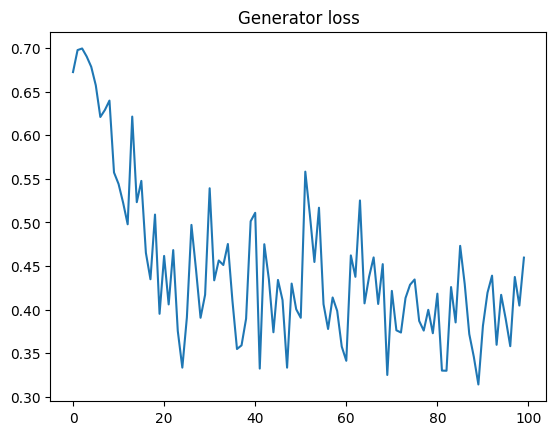

In [ ]:
lr = 0.001   # learning rate for generator
lrdisc = 0.001   # learning rate for generator

## parameters for training
n_epochs = 100
niterD=100
niterG=1

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

Glosses = []
Dlosses = []

iter_display = 10

# Main loop
for epoch in range(n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################
    for iter in range(0,niterD):
        optimD.zero_grad()
        fake_data = G(torch.randn(b, n_in, device=device)).detach()
        # Compute discriminator outputs for real and fake data
        D_real = D(y)
        D_fake = D(fake_data)
        # Compute discriminator loss
        Dloss = criterion(D_real, V1) + criterion(D_fake, V0)
        Dloss.backward()
        optimD.step()

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()
        fake_data = G(torch.randn(b, n_in, device=device)).detach()
        # Compute discriminator output for fake data
        D_fake = D(fake_data)
        # Generator loss
        Gloss = criterion(D_fake, V0)
        Gloss.backward()
        optimG.step()


    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item()))
    Glosses.append(Gloss.item())
    Dlosses.append(-Dloss.item())


    if(epoch % iter_display == 0):
        Dxgrid = sig(D(xgrid)).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, 1, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()

# Save final generator for later use
gan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
gan.load_state_dict(G.state_dict())

### Plot the evolution of the discriminator loss ###
plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()